# [**AN2DL project 2: Image Classification**](https://www.kaggle.com/competitions/an2dl2526c2/overview)

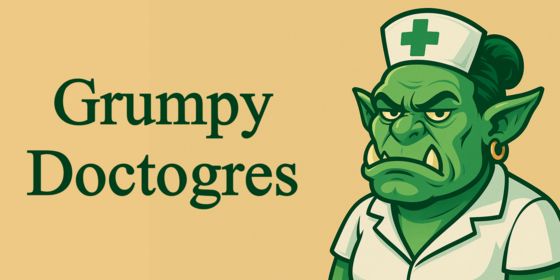

Portions of this code are licensed under Apache License 2.0

Copyright 2025 Eugenio Lomurno, Alberto Archetti, Roberto Basla, Carlo Sgaravatti

https://www.apache.org/licenses/LICENSE-2.0

## **Team information**
Group name: The Underfitters

Student 1:
*   Ilyas Benkirane

Student 2:
*   Anatole Lecomte

Student 3:
*   Nathan Luneau

# **Import libraries**
We import all the libraries and modules that will be necessary

In [ ]:
# Set seed for reproducibility
SEED = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np
import pandas as pd
from tqdm import tqdm

# Set seeds for random number generators in NumPy and Python
np.random.seed(SEED)
random.seed(SEED)

# Import PyTorch
import torch
torch.manual_seed(SEED)
from torch import nn
from torchsummary import summary
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision.transforms import v2 as transforms
from torch.utils.data import TensorDataset, DataLoader
!pip install torchview
from torchview import draw_graph

# Configurazione di TensorBoard e directory
logs_dir = "tensorboard"
!pkill -f tensorboard
%load_ext tensorboard
!mkdir -p models

if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")

print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")

# Import other libraries
import requests
from io import BytesIO
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

# **Importing data from kaggle**
We import the data from kaggle using the token that can be found in the profile of the user

In [ ]:
from google.colab import files
files.upload()  ## Download kaggle token and upload it

# Check if kaggle token exists
if not os.path.exists("/root/.kaggle/"):
  !mkdir ~/.kaggle/
  !mv kaggle.json ~/.kaggle/
  !chmod 600 ~/.kaggle/kaggle.json

!kaggle competitions download -c an2dl2526c2v2
!unzip an2dl2526c2v2.zip -d data/

We can see the number of images available in the training and test sets.

We also verify that we have uploaded the labels corresponding.

In [ ]:
print("Number of training images :", len(os.listdir("data/train_data"))//2)
print("Number of test images :", len(os.listdir("data/test_data"))//2)
print("train_labels.csv exists :", os.path.exists("data/train_labels.csv"))


Number of training images : 691
Number of test images : 477
train_labels.csv exists : True


Loading the labels

In [ ]:
labels_df = pd.read_csv("data/train_labels.csv")
y = labels_df["label"].values

# **Data exploration**
We start the data exploration by the visualisation of the images and the masks associated.
On the first 2 rows, we see the training datas, and on the last 2 rows, the test data.

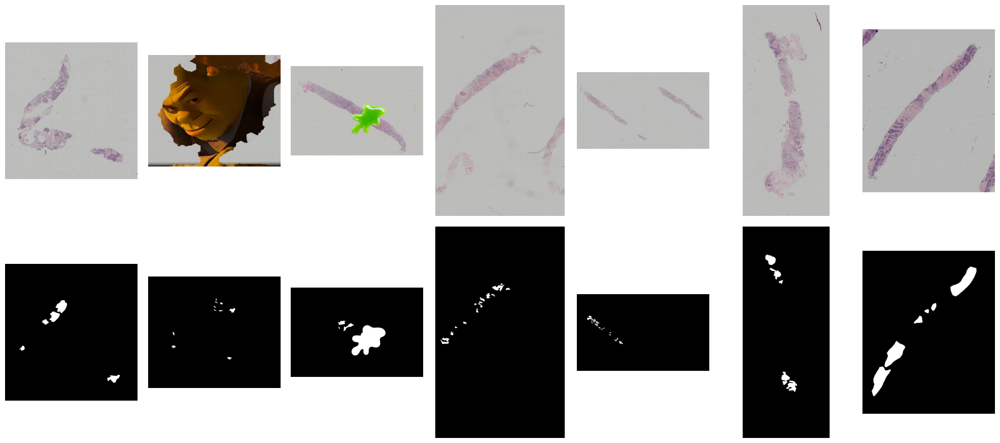

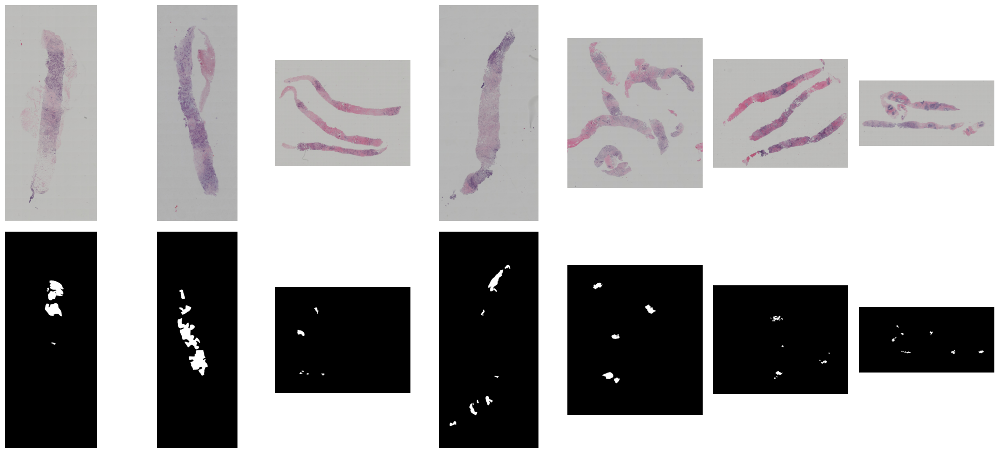

In [ ]:
# Number of images to display
num_img = 7
random.seed(SEED)
start_idx = 15 # We modify this to see another part of the dataset.
# The number 15 enables us to see both a shrek and a blob
rng = random.Random(SEED+start_idx)

# Create subplots for displaying training images
fig, axes = plt.subplots(2, num_img, figsize=(20, 9))
for i in range(num_img):
    ax1 = axes[0, i]
    ax2 = axes[1, i]
    n = rng.randint(0, len(y))
    img = cv2.imread(f"data/train_data/img_{n:04d}.png")
    img = img[..., ::-1]  # Convert BGR to RGB
    msk = cv2.imread(f"data/train_data/mask_{n:04d}.png")
    ax1.imshow(img)
    ax2.imshow(msk)
    ax1.axis('off')
    ax2.axis('off')
plt.tight_layout()
plt.show()

# Create subplots for displaying training images
fig, axes = plt.subplots(2, num_img, figsize=(20, 9))
for i in range(num_img):
    ax1 = axes[0, i]
    ax2 = axes[1, i]
    n = rng.randint(0, 477) # Because there are only 477 test images
    img = cv2.imread(f"data/test_data/img_{n:04d}.png")
    img = img[..., ::-1]  # Convert BGR to RGB
    msk = cv2.imread(f"data/test_data/mask_{n:04d}.png")
    ax1.imshow(img)
    ax2.imshow(msk)
    ax1.axis('off')
    ax2.axis('off')
plt.tight_layout()
plt.show()


Two types of artifacts can be observed in some images:
- some images are entirely replaced with frames from the movie Shrek.
- some images show green blob-like artifacts overlaid on the medical images.

# **Data preprocessing**

## Booger detection
Since we saw that some images present artifacts, we need to deal with that before training the model with the images.

First, we have to detect the green blobs.

In [ ]:
def has_green_blob(img_rgb,
                   g_thr=0.5,
                   margin=0.15,
                   min_ratio=0.001):
    """
    img_rgb: H x W x 3 (RGB)
    g_thr:   minimal green intensity
    margin:  how much G must exceed R and B
    min_ratio: minimal fraction of pixels to call it a blob image
    """
    R = img_rgb[:, :, 0]
    G = img_rgb[:, :, 1]
    B = img_rgb[:, :, 2]

    # pixels that are bright and clearly greener than red and blue
    mask = (G > g_thr) & (G > R + margin) & (G > B + margin)

    ratio_green = mask.mean()   # = nb of green pixels / total pixels
    return ratio_green > min_ratio


Creating a mask for the corresponding blob

In [ ]:
def blob_mask(img_rgb,
                   g_thr=0.5,
                   margin=0.15,
                   min_ratio=0.001):
    """
    img_rgb: H x W x 3 (RGB)
    g_thr:   minimal green intensity
    margin:  how much G must exceed R and B
    min_ratio: minimal fraction of pixels to call it a blob image
    """
    R = img_rgb[:, :, 0]
    G = img_rgb[:, :, 1]
    B = img_rgb[:, :, 2]

    # pixels that are bright and clearly greener than red and blue
    mask = (G > g_thr) & (G > R + margin) & (G > B + margin)
    return mask


Load all images and masks into arrays :
- If present, remove booger from mask
- If Shrek detected, image and mask not considered in the final set.


In [ ]:
def load_images_and_masks_from_folder(folder, label_df=None):
    """
    Load and preprocess images and masks from a specified folder.

    Args:
        folder (str): Path to the folder containing images and masks

    Returns:
        tuple: (images_array, masks_array) both with shape (N, 224, 224, 3)
    """
    images = []
    masks = []
    labels = []

    # Iterate through indices assuming img_XXXX.png and mask_XXXX.png pairs
    num_files = len(os.listdir(folder)) // 2  # assuming equal number of images and masks
    for i in tqdm(range(num_files)):
        img_path = os.path.join(folder, f"img_{i:04d}.png")
        mask_path = os.path.join(folder, f"mask_{i:04d}.png")

        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path)

        if img is None or mask is None:
            continue

        # Normalize image pixel values to [0, 1]
        img = (img / 255).astype(np.float32)
        mask = (mask / 255).astype(np.float32)

        # Convert image from BGR to RGB
        img = img[..., ::-1]
        mask = mask[..., ::-1]

        # Make the image dataset squared
        dim = min(img.shape[:-1])
        img = img[(img.shape[0]-dim)//2:(img.shape[0]+dim)//2,
                  (img.shape[1]-dim)//2:(img.shape[1]+dim)//2, :]
        dim_mask = min(mask.shape[:-1])
        mask = mask[(mask.shape[0]-dim_mask)//2:(mask.shape[0]+dim_mask)//2,
                    (mask.shape[1]-dim_mask)//2:(mask.shape[1]+dim_mask)//2, :]

        has_booger = has_green_blob(img, g_thr=0.5, margin=0.15, min_ratio=0.001)

        if isinstance(label_df, pd.DataFrame):
            label = label_df["label"].values[i]

        if has_booger:
            # We remove booger from mask
            bmask = blob_mask(img)  # Detect booger

            # Performing closing operation on bmask using disk kernel to remove white areas inside booger
            k = 50
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k, k))
            bmask = cv2.morphologyEx(bmask.astype(np.float32), cv2.MORPH_CLOSE, kernel)
            bmask = bmask == 1

            mask[bmask] = 0

            # Performing opening to remove very small edges on mask
            kernel = np.ones((3, 3), np.float32)
            mask = cv2.morphologyEx(mask.astype(np.float32), cv2.MORPH_OPEN, kernel)

        # Resize the image to 224x224 pixels
        img = cv2.resize(img, (224, 224))
        mask = cv2.resize(mask, (224, 224))

        ## Remove Shrek and boogers
        B = img[:, :, 2].ravel()
        G = img[:, :, 1].ravel()
        R = img[:, :, 0].ravel()

        hist_b, _ = np.histogram(B, bins=256, range=(0, 1))
        hist_g, _ = np.histogram(G, bins=256, range=(0, 1))
        hist_r, _ = np.histogram(R, bins=256, range=(0, 1))

        # Total number of pixels having intensity < 50
        count_b = np.sum(hist_b[:50])
        count_g = np.sum(hist_g[:50])
        count_r = np.sum(hist_r[:50])
        blacks = np.max([np.sum(hist_b[0:10]), np.sum(hist_g[0:10]), np.sum(hist_r[0:10])])
        whites = np.max([np.sum(hist_b[-25:]), np.sum(hist_g[-25:]), np.sum(hist_r[-25:])])

        total = 224*224

        bg_diff = (count_b - count_g) / total
        br_diff = (count_b - count_r) / total
        is_shrek_or_booger = ((bg_diff > 0.01) or (br_diff > 0.01) or blacks/total > 0.1) and (count_b/total > 0.001)  # We detect shreks and boogers

        if has_booger or not is_shrek_or_booger:   # If not Shrek
            images.append(img)
            masks.append(mask)
            if isinstance(label_df, pd.DataFrame):
                label = label_df["label"].values[i]
                labels.append(label)

    return np.array(images), np.array(masks), np.array(labels)

In [ ]:
train_img_path = "data/train_data"
X_train, X_train_masks, y_train = load_images_and_masks_from_folder(train_img_path, labels_df)
print(f"Loaded {len(X_train)} training images, {len(X_train_masks)} training masks and {len(y_train)} labels")

We can now try to see if the blobs were correctly removed in the mask

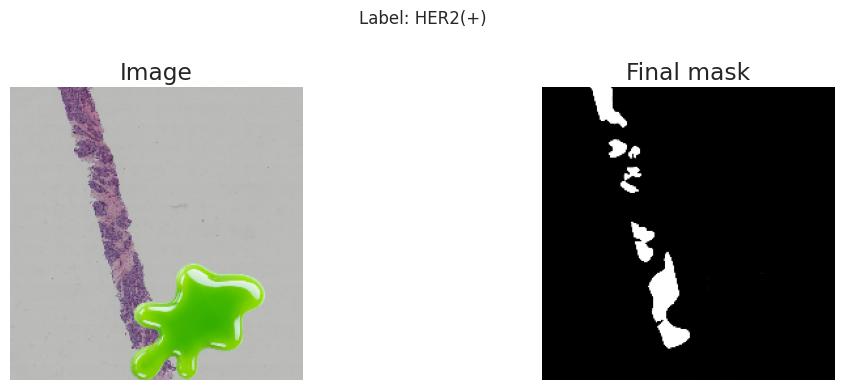

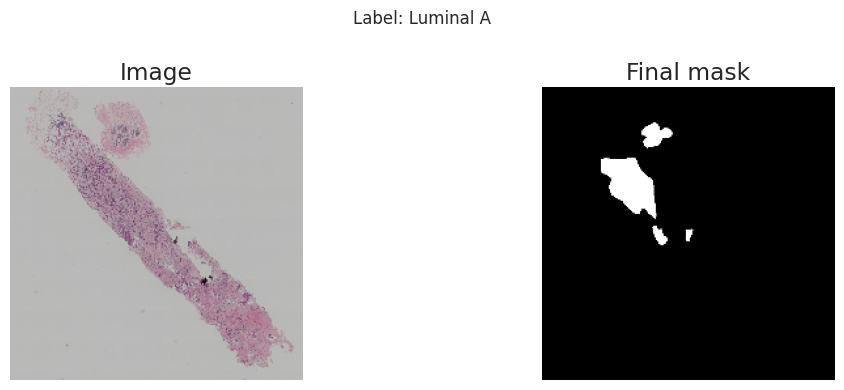

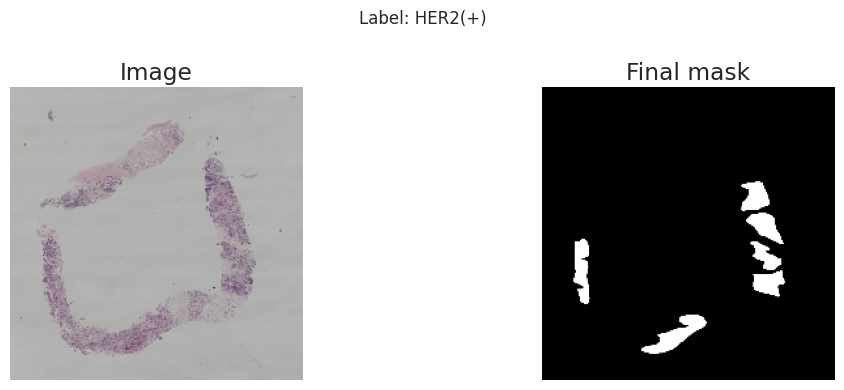

In [ ]:
# Number of samples to visualize
N_SAMPLES = 3
start_idx = 8 # We modify this to see another part of the dataset.
# The number 8 enables us to see a blob and its corrected mask
rng = random.Random(SEED+start_idx)
indices = rng.sample(range(len(X_train)), N_SAMPLES)

for idx in indices:
    img = X_train[idx]          # (224,224,3), float in [0,1]
    mask = X_train_masks[idx]   # (224,224,3), float in [0,1]
    label = y_train[idx] if len(y_train) > 0 else None

    # Convert mask to grayscale for visualization
    mask_gray = mask.mean(axis=2)

    # Overlay mask on image
    overlay = img.copy()
    overlay[mask_gray < 0.5] = 0  # masked-out areas in black

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask_gray, cmap="gray")
    plt.title("Final mask")
    plt.axis("off")

    if label is not None:
        plt.suptitle(f"Label: {label}", fontsize=12)

    plt.tight_layout()
    plt.show()


## Class distribution
We can now have a look at the class distribution

{'Luminal A': 0, 'Luminal B': 1, 'HER2(+)': 2, 'Triple negative': 3}


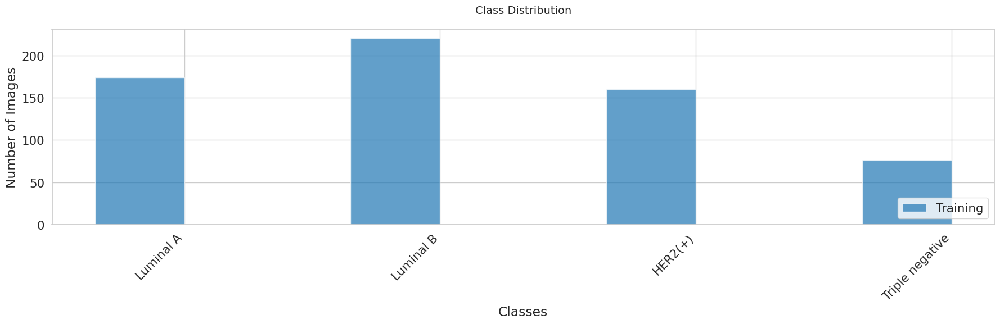

In [ ]:
class_names = ['Luminal A', 'Luminal B', 'HER2(+)', 'Triple negative']
class_to_index = {name: idx for idx, name in enumerate(class_names)}
print(class_to_index)

y_train_int = np.array([class_to_index[label] for label in y_train])

def plot_class_distribution(y_train, y_test, class_names):
    """Plot class distribution for training and test sets."""
    sns.set_style("whitegrid")
    plt.figure(figsize=(18, 6))

    # Calculate class distributions for training and test sets
    train_dist = np.bincount(y_train)

    # Create x positions and set bar width
    x = np.arange(len(class_names))
    width = 0.35

    # Plot bars for training and test distributions
    plt.bar(x - width / 2, train_dist, width, label='Training', color='#1f77b4', alpha=0.7)

    # Customize plot title and labels
    plt.title('Class Distribution', pad=20, fontsize=14)
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')

    # Set class names as x-axis labels with rotation
    plt.xticks(x, class_names, rotation=45, ha='right')

    # Add legend for training and test distributions
    plt.legend(loc='lower right')

    # Adjust layout for optimal spacing
    plt.tight_layout()
    plt.show()



# Execute function to plot class distribution
plot_class_distribution(y_train_int, X_train, class_names)

## Split into training and validation sets
We split the training dataset that was given into a training and a validation sets. The split is:
- 70% for the training set
- 30% for the validation set

In [ ]:
# Split training set into validation and test sets with stratification
index_TRAIN, index_VAL, y_TRAIN, y_VAL = train_test_split(
    list(range(len(X_train))),
    y_train_int,
    random_state=SEED,
    test_size=0.3,
    stratify=y_train_int
)

X_TRAIN = X_train[index_TRAIN]
X_MASK_TRAIN = X_train_masks[index_TRAIN]
X_VAL = X_train[index_VAL]
X_MASK_VAL = X_train_masks[index_VAL]

# Print shapes of the datasets
print(f"X_train shape: {X_TRAIN.shape}, y_train shape: {y_TRAIN.shape}")
print(f"X_val shape: {X_VAL.shape}, y_val shape: {y_VAL.shape}")
print('')
print(f"Number of labels per class in the training set : {np.bincount(y_TRAIN)}")
print(f"Number of labels per class in the validation set : {np.bincount(y_VAL)}")

# We want to know the percentages of each class in the training and validation sets
percentages_train = np.bincount(y_TRAIN)/y_TRAIN.shape[0]
percentages_val = np.bincount(y_VAL)/y_VAL.shape[0]
print('')
print(f"Percentages of labels per class in the training set : {np.round(percentages_train,2)}")
print(f"Percentages of labels per class in the validation set : {np.round(percentages_val,2)}")

X_train shape: (441, 224, 224, 3), y_train shape: (441,)
X_val shape: (189, 224, 224, 3), y_val shape: (189,)

Number of labels per class in the training set : [122 154 112  53]
Number of labels per class in the validation set : [52 66 48 23]

Percentages of labels per class in the training set : [0.28 0.35 0.25 0.12]
Percentages of labels per class in the validation set : [0.28 0.35 0.25 0.12]


Computing mean and std of the training set (for "from-scratch" learning)

In [ ]:
means = [0, 0, 0]
stds = [0, 0, 0]

for img in X_TRAIN:
  mean_r, mean_g, mean_b = np.mean(img, axis=(0,1))
  std_r, std_g, std_b = np.std(img, axis=(0,1))
  means[0] += mean_r
  means[1] += mean_g
  means[2] += mean_b
  stds[0] += std_r
  stds[1] += std_g
  stds[2] += std_b

means = [mean/len(X_TRAIN) for mean in means]
stds = [std/len(X_TRAIN) for std in stds]

print(means)
print(stds)


[np.float32(0.7095012), np.float32(0.69538474), np.float32(0.6997815)]
[np.float32(0.0574293), np.float32(0.082579), np.float32(0.06286956)]


Loading mean and std of the IMAGENET dataset (for transfer learning)

In [ ]:
# ImageNet normalization statistics
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

Setting input shape and number of classes

In [ ]:
# Define the input shape and number of classes
input_shape = (3, 128, 128)
num_classes = len(class_names)

print("Input Shape:", input_shape)
print("Number of Classes:", num_classes)

Input Shape: (3, 128, 128)
Number of Classes: 4


Creating the custom pytorch dataset for our human tissue images

In [ ]:
class TissueDataset(torch.utils.data.Dataset):
    """Custom PyTorch Dataset for human tissue images with optional augmentation and normalization."""

    def __init__(self, data, labels, masks=None, mean=None, std=None, augmentation=None, normalize_imagenet=False):
        """
        Args:
            data: numpy array of images (N, H, W, C) in range [0, 1]
            labels: numpy array of labels
            augmentation: transforms for data augmentation
            normalize_imagenet: whether to apply ImageNet normalization
        """
        #self.data = torch.transpose(torch.from_numpy(data), 1, 3)  # H,W,C to C,H,W
        self.labels = torch.from_numpy(labels).long()

        self.data = torch.from_numpy(data).permute(0, 3, 1, 2).float()  # N,C,H,W
        if masks is not None:
            if masks.ndim == 4:  # N,H,W,C or N,H,W,1
                self.masks = torch.from_numpy(masks).permute(0, 3, 1, 2).float()
            elif masks.ndim == 3:  # N,H,W
                self.masks = torch.from_numpy(masks).unsqueeze(1).float()
            else:
                raise ValueError("Unsupported mask shape")
        else:
            self.masks = None


        self.augmentation = augmentation
        self.normalize_imagenet = normalize_imagenet

        # ImageNet normalization transform
        if normalize_imagenet:
            self.normalize = transforms.Normalize(mean=mean, std=std)
        else:
            self.normalize = None

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = self.data[idx].clone()  # Clone to avoid modifying original
        label = self.labels[idx]

        # Apply mask if provided
        if self.masks is not None:
            mask = self.masks[idx]       # 1 x H x W ou C x H x W

            if mask.shape[0] == 1 and image.shape[0] == 3:
                mask = mask.repeat(3, 1, 1)

            image = image * mask          # application of the mask


        # Apply augmentation if provided (on images in [0, 1] range)
        if self.augmentation:
            image = self.augmentation(image)

        # Apply ImageNet normalization if requested
        if self.normalize:
            image = self.normalize(image)

        return image, label

In [ ]:
def make_loader(ds, batch_size, shuffle, drop_last):
    """Create a PyTorch DataLoader with optimized settings."""
    cpu_cores = os.cpu_count() or 2
    num_workers = max(2, min(4, cpu_cores))

    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers,
        pin_memory=True,
        pin_memory_device="cuda" if torch.cuda.is_available() else "",
        prefetch_factor=4,
    )

# **Network parameters**
In this section we define the parameters that we will use for the computation. If we want to try the model with a different parameter (for example if we change the learning rate), we change its value in this section.

In [ ]:
# Training parameters
LEARNING_RATE = 1e-3
EPOCHS = 300
PATIENCE = 30
VERBOSE = 10

# Define the batch size
BATCH_SIZE = 64

# Regularization
DROPOUT_RATE = 0.4

# Set up loss function
criterion = nn.CrossEntropyLoss()

# Weighted loss :
# labels_count = torch.tensor(np.bincount(y_TRAIN), dtype=torch.float32)
# class_weights = 1.0 / labels_count
# class_weights = class_weights / class_weights.sum() * num_classes

# criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))

# Print the defined parameters
print("Epochs:", EPOCHS)
print("Batch Size:", BATCH_SIZE)
print("Learning Rate:", LEARNING_RATE)
print("Dropout Rate:", DROPOUT_RATE)
print("Patience:", PATIENCE)

Epochs: 300
Batch Size: 64
Learning Rate: 0.001
Dropout Rate: 0.4
Patience: 30


# **Model training**

## Training functions
This subsection contains all the functions needed for the training

In [ ]:
def train_one_epoch(model, train_loader, criterion, optimizer, scaler, device):
    """Train for one epoch."""
    model.train()

    running_loss = 0.0
    all_predictions = []
    all_targets = []

    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
            logits = model(inputs)
            loss = criterion(logits, targets)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * inputs.size(0)
        predictions = logits.argmax(dim=1)
        all_predictions.append(predictions.cpu().numpy())
        all_targets.append(targets.cpu().numpy())

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = accuracy_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions)
    )
    epoch_f1 = f1_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions),
        average='weighted'
    )

    return epoch_loss, epoch_acc, epoch_f1


def validate_one_epoch(model, val_loader, criterion, device):
    """Validate for one epoch."""
    model.eval()

    running_loss = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                logits = model(inputs)
                loss = criterion(logits, targets)

            running_loss += loss.item() * inputs.size(0)
            predictions = logits.argmax(dim=1)
            all_predictions.append(predictions.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

    epoch_loss = running_loss / len(val_loader.dataset)
    epoch_accuracy = accuracy_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions)
    )
    epoch_f1 = f1_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions),
        average='weighted'
    )

    return epoch_loss, epoch_accuracy, epoch_f1

def fit(model, train_loader, val_loader, epochs, criterion, optimizer, scaler, device,
        patience=0, evaluation_metric="val_f1", mode='max',
        restore_best_weights=True, writer=None, verbose=1, experiment_name=""):
    """Train the neural network model."""

    training_history = {
        'train_loss': [], 'val_loss': [],
        'train_acc': [], 'val_acc': [],
        'train_f1': [], 'val_f1': []
    }

    if patience > 0:
        patience_counter = 0
        best_metric = float('-inf') if mode == 'max' else float('inf')
        best_epoch = 0

    print(f"Training {epochs} epochs...")

    for epoch in range(1, epochs + 1):
        train_loss, train_acc, train_f1 = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, device
        )

        val_loss, val_acc, val_f1 = validate_one_epoch(
            model, val_loader, criterion, device
        )

        training_history['train_loss'].append(train_loss)
        training_history['val_loss'].append(val_loss)
        training_history['train_acc'].append(train_acc)
        training_history['val_acc'].append(val_acc)
        training_history['train_f1'].append(train_f1)
        training_history['val_f1'].append(val_f1)

        if writer is not None:
            writer.add_scalar('Loss/Training', train_loss, epoch)
            writer.add_scalar('Loss/Validation', val_loss, epoch)
            writer.add_scalar('Accuracy/Training', train_acc, epoch)
            writer.add_scalar('Accuracy/Validation', val_acc, epoch)
            writer.add_scalar('F1/Training', train_f1, epoch)
            writer.add_scalar('F1/Validation', val_f1, epoch)

        if verbose > 0:
            if epoch % verbose == 0 or epoch == 1:
                print(f"Epoch {epoch:3d}/{epochs} | "
                    f"Train: Loss={train_loss:.4f}, F1={train_f1:.4f} | "
                    f"Val: Loss={val_loss:.4f}, F1={val_f1:.4f}")

        if patience > 0:
            current_metric = training_history[evaluation_metric][-1]
            is_improvement = (current_metric > best_metric) if mode == 'max' else (current_metric < best_metric)

            if is_improvement:
                best_metric = current_metric
                best_epoch = epoch
                torch.save(model.state_dict(), "models/"+experiment_name+'_model.pt')
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"Early stopping triggered after {epoch} epochs.")
                    break

    if restore_best_weights and patience > 0:
        model.load_state_dict(torch.load("models/"+experiment_name+'_model.pt'))
        print(f"Best model restored from epoch {best_epoch} with {evaluation_metric} {best_metric:.4f}")

    if patience == 0:
        torch.save(model.state_dict(), "models/"+experiment_name+'_model.pt')

    if writer is not None:
        writer.close()

    return model, training_history

We will now test different CNN architectures

# **1. MobileNetV3Small**

## *Train MobileNetV3Small from Scratch*

In [ ]:
class MobileNetV3FromScratch(nn.Module):
    """MobileNetV3Small trained from scratch with augmentation."""

    def __init__(self, num_classes, dropout_rate=0.3):
        super().__init__()

        # Data augmentation
        self.augmentation = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
        ])

        # MobileNetV3Small backbone (no pretrained weights)
        self.backbone = torchvision.models.mobilenet_v3_small(weights=None)

        # Replace classifier
        in_features = self.backbone.classifier[0].in_features
        self.backbone.classifier = nn.Sequential(
            nn.Linear(in_features, in_features),
            nn.Hardswish(),
            nn.Dropout(dropout_rate),
            nn.Linear(in_features, num_classes)
        )

    def forward(self, x):
        # Apply augmentation only during training
        if self.training:
            x = self.augmentation(x)
        return self.backbone(x)

In [ ]:
# Create model and move to device
MN_scratch_model = MobileNetV3FromScratch(num_classes, DROPOUT_RATE).to(device)

# Display model summary
summary(MN_scratch_model, input_size=input_shape)
model_graph = draw_graph(MN_scratch_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITHOUT ImageNet normalization (training from scratch)
train_scratch_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_scratch_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_scratch_loader = make_loader(train_scratch_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_scratch_loader = make_loader(val_scratch_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup training
experiment_name = "MN_from_scratch"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)

optimizer = torch.optim.Adam(MN_scratch_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train model from scratch
MN_scratch_model, MN_scratch_history = fit(
    model=MN_scratch_model,
    train_loader=train_scratch_loader,
    val_loader=val_scratch_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(MN_scratch_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.4035, F1=0.2588 | Val: Loss=1.3732, F1=0.1808
Epoch  10/300 | Train: Loss=1.3292, F1=0.2518 | Val: Loss=1.3362, F1=0.1808
Epoch  20/300 | Train: Loss=1.3261, F1=0.2287 | Val: Loss=1.3274, F1=0.1808
Epoch  30/300 | Train: Loss=1.3057, F1=0.3045 | Val: Loss=1.3288, F1=0.1808
Early stopping triggered after 31 epochs.
Best model restored from epoch 1 with val_f1 0.1808
Final validation F1 score: 18.08%
CPU times: user 1min 38s, sys: 8.71 s, total: 1min 47s
Wall time: 2min 31s


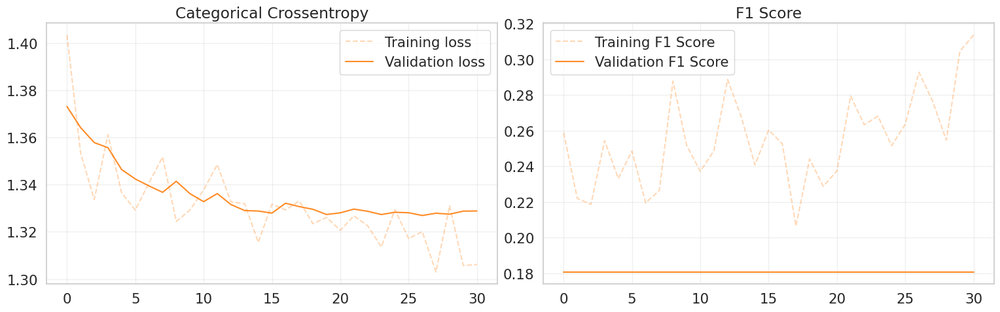

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(MN_scratch_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(MN_scratch_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(MN_scratch_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(MN_scratch_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Transfer learning*

In [ ]:
class MobileNetV3TransferLearning(nn.Module):
    """
    MobileNetV3Small with pretrained weights for transfer learning.

    IMPORTANT: This model expects ImageNet-normalized inputs!
    Images should be normalized with mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225]
    """

    def __init__(self, num_classes, dropout_rate=0.3, freeze_backbone=True):
        super().__init__()

        # MobileNetV3Small backbone with ImageNet pretrained weights
        self.backbone = torchvision.models.mobilenet_v3_small(
            weights=torchvision.models.MobileNet_V3_Small_Weights.IMAGENET1K_V1
        )

        # Freeze backbone if requested
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False

        # Replace classifier (always trainable)
        in_features = self.backbone.classifier[0].in_features
        self.backbone.classifier = nn.Sequential(
            nn.Linear(in_features, in_features),
            nn.Hardswish(),
            nn.Dropout(dropout_rate),
            nn.Linear(in_features, num_classes)
        )

    def forward(self, x):
        return self.backbone(x)

In [ ]:
# Create transfer learning model
MN_tl_model = MobileNetV3TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=True).to(device)

# Display model summary
summary(MN_tl_model, input_size=input_shape)
model_graph = draw_graph(MN_tl_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITH ImageNet normalization (for pretrained model)
train_tl_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_tl_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_tl_loader = make_loader(train_tl_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_tl_loader = make_loader(val_tl_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup training
experiment_name = "MN_transfer_learning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)

optimizer = torch.optim.Adam(MN_tl_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train with transfer learning
MN_tl_model, MN_tl_history = fit(
    model=MN_tl_model,
    train_loader=train_tl_loader,
    val_loader=val_tl_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(MN_tl_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.3767, F1=0.2653 | Val: Loss=1.3412, F1=0.2862
Epoch  10/300 | Train: Loss=1.2552, F1=0.3744 | Val: Loss=1.4395, F1=0.1968
Epoch  20/300 | Train: Loss=1.2079, F1=0.4304 | Val: Loss=1.5096, F1=0.2205
Epoch  30/300 | Train: Loss=1.1600, F1=0.4543 | Val: Loss=1.6244, F1=0.2269
Early stopping triggered after 31 epochs.
Best model restored from epoch 1 with val_f1 0.2862
Final validation F1 score: 28.62%
CPU times: user 10.1 s, sys: 7.58 s, total: 17.7 s
Wall time: 1min 9s


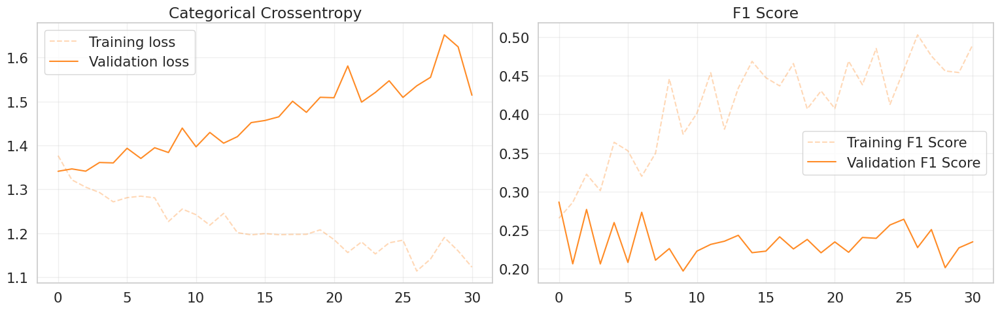

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(MN_tl_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(MN_tl_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(MN_tl_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(MN_tl_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Fine-Tuning*

In [ ]:
# Load the transfer learning model
MN_ft_model = MobileNetV3TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=False).to(device)
MN_ft_model.load_state_dict(torch.load("models/MN_transfer_learning_model.pt"))

# Unfreeze the last N layers of the backbone
N_LAYERS_TO_UNFREEZE = 20

# First, freeze everything
for param in MN_ft_model.backbone.parameters():
    param.requires_grad = False

# Unfreeze last N layers (excluding classifier which is always trainable)
backbone_layers = list(MN_ft_model.backbone.features.children())
for layer in backbone_layers[-N_LAYERS_TO_UNFREEZE:]:
    for param in layer.parameters():
        param.requires_grad = True

# Count trainable parameters
total_params = sum(p.numel() for p in MN_ft_model.parameters())
trainable_params = sum(p.numel() for p in MN_ft_model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

# Display which layers are trainable
print("\nTrainable layers:")
for name, param in MN_ft_model.named_parameters():
    if param.requires_grad:
        print(f"  {name}: {param.numel():,} parameters")

In [ ]:
# Reuse datasets from transfer learning (with ImageNet normalization)
train_ft_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_ft_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD,augmentation=None, normalize_imagenet=True)

train_ft_loader = make_loader(train_ft_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_ft_loader = make_loader(val_ft_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup training with lower learning rate for fine-tuning
experiment_name = "MN_fine_tuning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)

# Lower learning rate for fine-tuning
optimizer = torch.optim.Adam(MN_ft_model.parameters(), lr=LEARNING_RATE/10)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Fine-tune the model
MN_ft_model, MN_ft_history = fit(
    model=MN_ft_model,
    train_loader=train_ft_loader,
    val_loader=val_ft_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(MN_ft_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.3422, F1=0.1912 | Val: Loss=1.3407, F1=0.2714
Epoch  10/300 | Train: Loss=1.2855, F1=0.3211 | Val: Loss=1.3441, F1=0.2653
Epoch  20/300 | Train: Loss=1.2045, F1=0.4485 | Val: Loss=1.3611, F1=0.2687
Epoch  30/300 | Train: Loss=1.0750, F1=0.5414 | Val: Loss=1.3750, F1=0.2755
Epoch  40/300 | Train: Loss=0.9089, F1=0.6428 | Val: Loss=1.4198, F1=0.2757
Epoch  50/300 | Train: Loss=0.7474, F1=0.7337 | Val: Loss=1.5390, F1=0.3237
Epoch  60/300 | Train: Loss=0.6248, F1=0.8025 | Val: Loss=1.4827, F1=0.3596
Epoch  70/300 | Train: Loss=0.5146, F1=0.8626 | Val: Loss=1.5251, F1=0.3324
Epoch  80/300 | Train: Loss=0.4309, F1=0.8993 | Val: Loss=1.5686, F1=0.3669
Epoch  90/300 | Train: Loss=0.3798, F1=0.9134 | Val: Loss=1.5788, F1=0.3701
Early stopping triggered after 93 epochs.
Best model restored from epoch 63 with val_f1 0.3842
Final validation F1 score: 38.42%
CPU times: user 52 s, sys: 23 s, total: 1min 15s
Wall time: 3min 28s


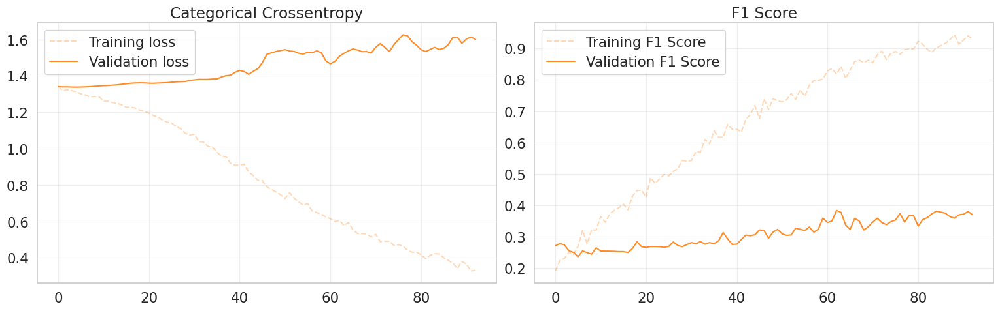

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(MN_ft_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(MN_ft_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(MN_ft_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(MN_ft_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# **2. EfficientNetB0**

## *Train EfficientNetB0 from Scratch*

In [ ]:
class EfficientNetB0FromScratch(nn.Module):
    """EfficientNet-B0 trained from scratch (Random weights)."""

    def __init__(self, num_classes, dropout_rate=0.3):
        super().__init__()

        # Load architecture with NO pretrained weights
        self.backbone = torchvision.models.efficientnet_b0(weights=None)

        # Re-build classifier head
        # EfficientNet classifier is a Sequential; the Linear layer is the last one [-1]
        in_features = self.backbone.classifier[-1].in_features

        self.backbone.classifier = nn.Sequential(
            nn.Dropout(p=dropout_rate, inplace=True),
            nn.Linear(in_features, num_classes),
        )

    def forward(self, x):
        return self.backbone(x)

In [ ]:
# Initialize model
EN_scratch_model = EfficientNetB0FromScratch(num_classes, DROPOUT_RATE).to(device)

# Visualize structure
summary(EN_scratch_model, input_size=input_shape)
model_graph = draw_graph(EN_scratch_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITHOUT ImageNet normalization (training from scratch)
train_scratch_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_scratch_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_scratch_loader = make_loader(train_scratch_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_scratch_loader = make_loader(val_scratch_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup Training
experiment_name = "EN_from_scratch"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(EN_scratch_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train model from scratch
EN_scratch_model, EN_scratch_history = fit(
    model=EN_scratch_model,
    train_loader=train_scratch_loader,
    val_loader=val_scratch_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(EN_scratch_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.4293, F1=0.3314 | Val: Loss=1.3522, F1=0.1808
Epoch  10/300 | Train: Loss=1.3879, F1=0.2178 | Val: Loss=1.6096, F1=0.1822
Epoch  20/300 | Train: Loss=1.3195, F1=0.2411 | Val: Loss=1.6652, F1=0.2225
Epoch  30/300 | Train: Loss=1.3400, F1=0.2685 | Val: Loss=1.4569, F1=0.2298
Epoch  40/300 | Train: Loss=1.3264, F1=0.2081 | Val: Loss=1.3316, F1=0.2105
Epoch  50/300 | Train: Loss=1.3268, F1=0.2569 | Val: Loss=1.3790, F1=0.2272
Epoch  60/300 | Train: Loss=1.3096, F1=0.2615 | Val: Loss=1.4656, F1=0.2396
Epoch  70/300 | Train: Loss=1.3058, F1=0.2992 | Val: Loss=1.4280, F1=0.2599
Epoch  80/300 | Train: Loss=1.2752, F1=0.3152 | Val: Loss=1.5506, F1=0.2864
Epoch  90/300 | Train: Loss=1.2843, F1=0.2821 | Val: Loss=2.0889, F1=0.2339
Epoch 100/300 | Train: Loss=1.2599, F1=0.3528 | Val: Loss=1.9811, F1=0.2501
Early stopping triggered after 104 epochs.
Best model restored from epoch 74 with val_f1 0.3045
Final validation F1 score: 30.45%
CPU times: 

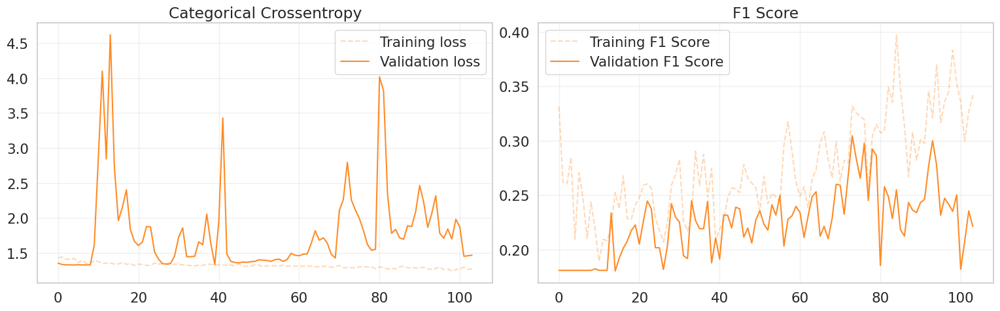

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(EN_scratch_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(EN_scratch_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(EN_scratch_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(EN_scratch_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Transfer Learning*

In [ ]:
class EfficientNetB0TransferLearning(nn.Module):
    """EfficientNet-B0 with ImageNet pretrained weights."""

    def __init__(self, num_classes, dropout_rate=0.3, freeze_backbone=True):
        super().__init__()

        # Load weights pretrained on ImageNet
        self.backbone = torchvision.models.efficientnet_b0(
            weights=torchvision.models.EfficientNet_B0_Weights.DEFAULT
        )

        # Freeze the backbone layers (features)
        if freeze_backbone:
            for param in self.backbone.features.parameters():
                param.requires_grad = False

        # Replace classifier (Always trainable)
        in_features = self.backbone.classifier[-1].in_features
        self.backbone.classifier = nn.Sequential(
            nn.Dropout(p=dropout_rate, inplace=True),
            nn.Linear(in_features, num_classes),
        )

    def forward(self, x):
        return self.backbone(x)

In [ ]:
# Create transfer learning model
EN_tl_model = EfficientNetB0TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=True).to(device)

# Display model summary
summary(EN_tl_model, input_size=input_shape)
model_graph = draw_graph(EN_tl_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITH ImageNet normalization (for pretrained model)
train_tl_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_tl_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_tl_loader = make_loader(train_tl_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_tl_loader = make_loader(val_tl_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup training
experiment_name = "EN_transfer_learning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(EN_tl_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train with transfer learning
EN_tl_model, EN_tl_history = fit(
    model=EN_tl_model,
    train_loader=train_tl_loader,
    val_loader=val_tl_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(EN_tl_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.3799, F1=0.2798 | Val: Loss=1.3495, F1=0.2662
Epoch  10/300 | Train: Loss=1.2765, F1=0.3757 | Val: Loss=1.3350, F1=0.3269
Epoch  20/300 | Train: Loss=1.2123, F1=0.4317 | Val: Loss=1.3338, F1=0.3339
Epoch  30/300 | Train: Loss=1.1700, F1=0.4670 | Val: Loss=1.3398, F1=0.2995
Epoch  40/300 | Train: Loss=1.1638, F1=0.4963 | Val: Loss=1.3550, F1=0.3356
Epoch  50/300 | Train: Loss=1.1453, F1=0.4914 | Val: Loss=1.3662, F1=0.3504
Epoch  60/300 | Train: Loss=1.1383, F1=0.5090 | Val: Loss=1.3719, F1=0.3315
Epoch  70/300 | Train: Loss=1.1251, F1=0.4842 | Val: Loss=1.3732, F1=0.3177
Epoch  80/300 | Train: Loss=1.1082, F1=0.5306 | Val: Loss=1.3946, F1=0.3251
Early stopping triggered after 84 epochs.
Best model restored from epoch 54 with val_f1 0.3572
Final validation F1 score: 35.72%
CPU times: user 40.6 s, sys: 21.8 s, total: 1min 2s
Wall time: 2min 49s


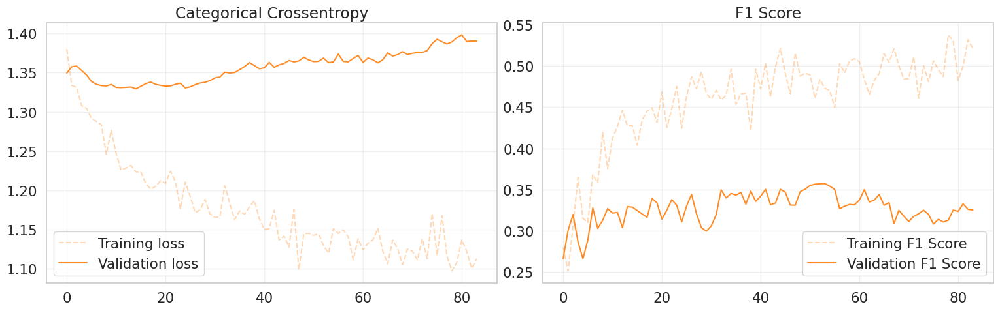

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(EN_tl_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(EN_tl_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(EN_tl_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(EN_tl_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Fine-Tuning*

In [ ]:
# Load the transfer learning model
EN_ft_model = EfficientNetB0TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=False).to(device)
EN_ft_model.load_state_dict(torch.load("models/EN_transfer_learning_model.pt"))

# Strategy: Freeze everything first, then unfreeze the last few blocks
for param in EN_ft_model.parameters():
    param.requires_grad = False

# The classifier is always trainable
for param in EN_ft_model.backbone.classifier.parameters():
    param.requires_grad = True

# Unfreeze the last 2 blocks of the feature extractor (EfficientNet-B0 has 9 blocks usually)
# Adjust slice index [-2:] to unfreeze more or fewer layers
for block in EN_ft_model.backbone.features[-2:]:
    for param in block.parameters():
        param.requires_grad = True

# Check trainable parameters
trainable_params = sum(p.numel() for p in EN_ft_model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in EN_ft_model.parameters())
print(f"Trainable parameters: {trainable_params:,} / {total_params:,}")

Trainable parameters: 1,134,516 / 4,012,672


In [ ]:
# Reuse datasets from transfer learning (with ImageNet normalization)
train_ft_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_ft_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD,augmentation=None, normalize_imagenet=True)

train_ft_loader = make_loader(train_ft_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_ft_loader = make_loader(val_ft_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup Training (Lower learning rate for Fine-Tuning)
experiment_name = "EN_fine_tuning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(EN_ft_model.parameters(), lr=LEARNING_RATE/10) # 10x smaller LR
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Fine-tune the model
EN_ft_model, EN_ft_history = fit(
    model=EN_ft_model,
    train_loader=train_ft_loader,
    val_loader=val_ft_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(EN_ft_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.1204, F1=0.5012 | Val: Loss=1.3708, F1=0.3428
Epoch  10/300 | Train: Loss=1.0151, F1=0.6044 | Val: Loss=1.3989, F1=0.3245
Epoch  20/300 | Train: Loss=1.0092, F1=0.5657 | Val: Loss=1.4278, F1=0.3298
Epoch  30/300 | Train: Loss=0.9267, F1=0.6365 | Val: Loss=1.4877, F1=0.3235
Early stopping triggered after 32 epochs.
Best model restored from epoch 2 with val_f1 0.3474
Final validation F1 score: 34.74%
CPU times: user 16 s, sys: 8.21 s, total: 24.2 s
Wall time: 1min 4s


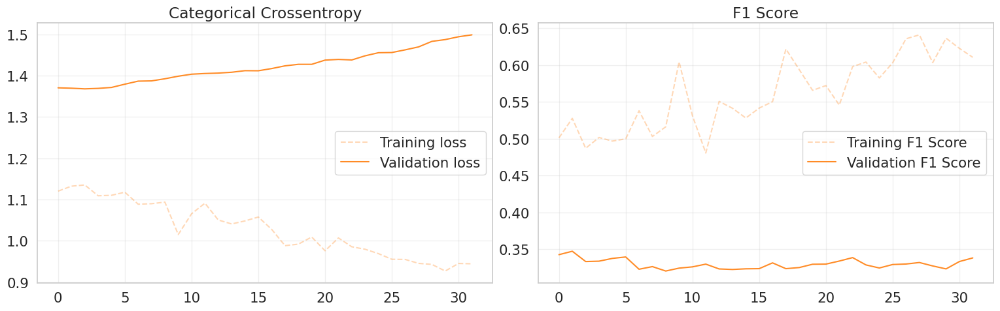

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(EN_ft_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(EN_ft_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(EN_ft_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(EN_ft_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# **3. ResNet18**

## *Train ResNet18 from Scratch*

In [ ]:
import torch.nn.functional as F

class ResNet18FromScratch(nn.Module):
    """EfficientNet-B0 with ImageNet pretrained weights."""

    def __init__(self, num_classes, dropout_rate=0.3):
        super().__init__()

        # Load weights pretrained on ImageNet
        self.backbone = torchvision.models.resnet18(
            weights=torchvision.models.ResNet18_Weights.DEFAULT
        )

        # Replace classifier (Always trainable)
        # For ResNet, the final layer is 'fc'
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Dropout(p=dropout_rate, inplace=True),
            nn.Linear(in_features, num_classes),
        )

    def forward(self, x, mask=None):
        return self.backbone(x)

In [ ]:
# Initialize model
RN_scratch_model = ResNet18FromScratch(num_classes, DROPOUT_RATE).to(device)

# Visualize structure
summary(RN_scratch_model, input_size=input_shape)
model_graph = draw_graph(RN_scratch_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITHOUT ImageNet normalization (training from scratch)
train_scratch_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_scratch_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_scratch_loader = make_loader(train_scratch_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_scratch_loader = make_loader(val_scratch_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup Training
experiment_name = "RN_from_scratch"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(RN_scratch_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train model from scratch
RN_scratch_model, RN_scratch_history = fit(
    model=RN_scratch_model,
    train_loader=train_scratch_loader,
    val_loader=val_scratch_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(RN_scratch_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.7513, F1=0.2612 | Val: Loss=3.0888, F1=0.1513
Epoch  10/300 | Train: Loss=1.3505, F1=0.3443 | Val: Loss=1.5174, F1=0.2287
Epoch  20/300 | Train: Loss=1.1622, F1=0.4656 | Val: Loss=1.8357, F1=0.3180
Epoch  30/300 | Train: Loss=1.0257, F1=0.5523 | Val: Loss=3.7087, F1=0.1211
Epoch  40/300 | Train: Loss=0.7832, F1=0.6846 | Val: Loss=6.5482, F1=0.1977
Epoch  50/300 | Train: Loss=0.5258, F1=0.7868 | Val: Loss=2.9632, F1=0.2674
Epoch  60/300 | Train: Loss=0.4631, F1=0.8136 | Val: Loss=3.7968, F1=0.2320
Epoch  70/300 | Train: Loss=0.3636, F1=0.8652 | Val: Loss=3.5911, F1=0.2757
Epoch  80/300 | Train: Loss=0.2421, F1=0.9205 | Val: Loss=4.5549, F1=0.3018
Epoch  90/300 | Train: Loss=0.2399, F1=0.9184 | Val: Loss=5.6227, F1=0.3011
Epoch 100/300 | Train: Loss=0.2391, F1=0.9250 | Val: Loss=3.9693, F1=0.3397
Early stopping triggered after 108 epochs.
Best model restored from epoch 78 with val_f1 0.3584
Final validation F1 score: 35.84%
CPU times: 

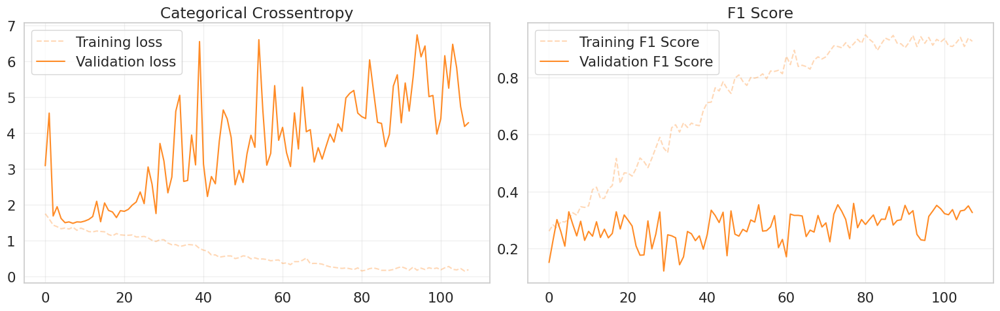

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(RN_scratch_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(RN_scratch_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(RN_scratch_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(RN_scratch_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Transfer Learning*

In [ ]:
import torch.nn.functional as F

class ResNet18TransferLearning(nn.Module):
    """ResNet18 with ImageNet pretrained weights."""

    def __init__(self, num_classes, dropout_rate=0.3, freeze_backbone=False):
        super().__init__()

        # Load weights pretrained on ImageNet
        self.backbone = torchvision.models.resnet18(
            weights=torchvision.models.ResNet18_Weights.DEFAULT
        )

        # Freeze the backbone layers (features)
        if freeze_backbone:
            # ResNet's feature extractor is everything except the final FC layer
            for param in self.backbone.parameters():
                param.requires_grad = False

        # Replace classifier (Always trainable)
        # For ResNet, the final layer is 'fc'
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Dropout(p=dropout_rate, inplace=True),
            nn.Linear(in_features, num_classes),
        )

    def forward(self, x, mask=None):
        return self.backbone(x)

In [ ]:
# Create transfer learning model
RN_tl_model = ResNet18TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=True).to(device)

# Display model summary
summary(RN_tl_model, input_size=input_shape)
model_graph = draw_graph(RN_tl_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITH ImageNet normalization (for pretrained model)
train_tl_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_tl_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_tl_loader = make_loader(train_tl_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_tl_loader = make_loader(val_tl_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup training
experiment_name = "RN_transfer_learning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(RN_tl_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train with transfer learning
RN_tl_model, RN_tl_history = fit(
    model=RN_tl_model,
    train_loader=train_tl_loader,
    val_loader=val_tl_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(RN_tl_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.5467, F1=0.2730 | Val: Loss=1.3676, F1=0.2320
Epoch  10/300 | Train: Loss=1.3712, F1=0.3384 | Val: Loss=1.3299, F1=0.3357
Epoch  20/300 | Train: Loss=1.3464, F1=0.3506 | Val: Loss=1.3279, F1=0.3005
Epoch  30/300 | Train: Loss=1.2368, F1=0.3855 | Val: Loss=1.3252, F1=0.2897
Epoch  40/300 | Train: Loss=1.2925, F1=0.3678 | Val: Loss=1.3267, F1=0.3166
Epoch  50/300 | Train: Loss=1.2344, F1=0.3867 | Val: Loss=1.3247, F1=0.3277
Epoch  60/300 | Train: Loss=1.2503, F1=0.4045 | Val: Loss=1.3539, F1=0.2735
Epoch  70/300 | Train: Loss=1.2524, F1=0.3902 | Val: Loss=1.3339, F1=0.3261
Epoch  80/300 | Train: Loss=1.2551, F1=0.3901 | Val: Loss=1.3337, F1=0.3139
Epoch  90/300 | Train: Loss=1.2757, F1=0.3716 | Val: Loss=1.3500, F1=0.3074
Epoch 100/300 | Train: Loss=1.2049, F1=0.4400 | Val: Loss=1.3592, F1=0.3123
Epoch 110/300 | Train: Loss=1.2565, F1=0.4101 | Val: Loss=1.3469, F1=0.3158
Epoch 120/300 | Train: Loss=1.2221, F1=0.4154 | Val: Loss=1.3374,

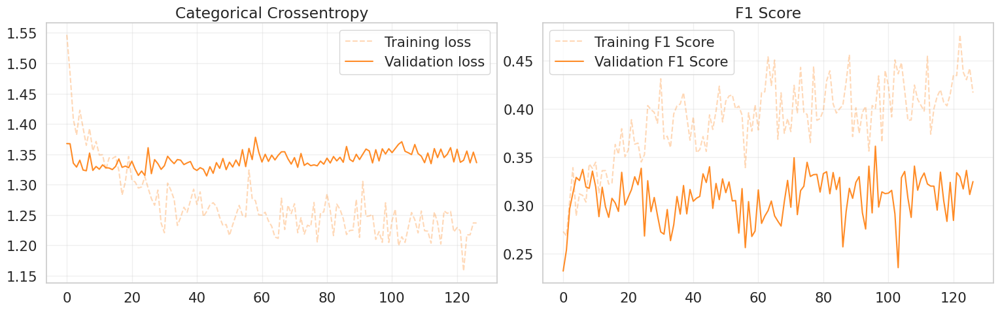

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(RN_tl_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(RN_tl_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(RN_tl_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(RN_tl_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Fine-Tuning*

In [ ]:
# Load the transfer learning model
RN_ft_model = ResNet18TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=True).to(device)
RN_ft_model.load_state_dict(torch.load(f"models/{experiment_name}_model.pt"))

# The final classification layer (fc) is always trainable
for param in RN_ft_model.backbone.fc.parameters():
    param.requires_grad = True

# Unfreeze specific last layers of the ResNet backbone
# For ResNet50, 'layer4' and 'layer3' are the last two main convolutional blocks
for param in RN_ft_model.backbone.layer4.parameters():
    param.requires_grad = True

# for param in RN_ft_model.backbone.layer3.parameters():
#     param.requires_grad = True

# Check trainable parameters
trainable_params = sum(p.numel() for p in RN_ft_model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in RN_ft_model.parameters())
print(f"Trainable parameters: {trainable_params:,} / {total_params:,}")

# Optionally, print the names of trainable parameters to verify
print("\nTrainable layers:")
for name, param in RN_ft_model.named_parameters():
    if param.requires_grad:
        print(f"  {name}: {param.numel():,} parameters")

# print total number of trainable parameters over total number of parameters
print(f"Total trainable parameters: {trainable_params:,}/{total_params:,}")

Trainable parameters: 8,395,780 / 11,178,564

Trainable layers:
  backbone.layer4.0.conv1.weight: 1,179,648 parameters
  backbone.layer4.0.bn1.weight: 512 parameters
  backbone.layer4.0.bn1.bias: 512 parameters
  backbone.layer4.0.conv2.weight: 2,359,296 parameters
  backbone.layer4.0.bn2.weight: 512 parameters
  backbone.layer4.0.bn2.bias: 512 parameters
  backbone.layer4.0.downsample.0.weight: 131,072 parameters
  backbone.layer4.0.downsample.1.weight: 512 parameters
  backbone.layer4.0.downsample.1.bias: 512 parameters
  backbone.layer4.1.conv1.weight: 2,359,296 parameters
  backbone.layer4.1.bn1.weight: 512 parameters
  backbone.layer4.1.bn1.bias: 512 parameters
  backbone.layer4.1.conv2.weight: 2,359,296 parameters
  backbone.layer4.1.bn2.weight: 512 parameters
  backbone.layer4.1.bn2.bias: 512 parameters
  backbone.fc.1.weight: 2,048 parameters
  backbone.fc.1.bias: 4 parameters
Total trainable parameters: 8,395,780/11,178,564


In [ ]:
# Reuse datasets from transfer learning (with ImageNet normalization)
train_ft_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_ft_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD,augmentation=None, normalize_imagenet=True)

train_ft_loader = make_loader(train_ft_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_ft_loader = make_loader(val_ft_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup Training (Lower learning rate for Fine-Tuning)
experiment_name = "RN_fine_tuning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(RN_ft_model.parameters(), lr=LEARNING_RATE/10) # 10x smaller LR
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Fine-tune the model
RN_ft_model, RN_ft_history = fit(
    model=RN_ft_model,
    train_loader=train_ft_loader,
    val_loader=val_ft_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(RN_ft_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.2610, F1=0.4262 | Val: Loss=1.3747, F1=0.3481
Epoch  10/300 | Train: Loss=0.8723, F1=0.6723 | Val: Loss=1.5208, F1=0.3483
Epoch  20/300 | Train: Loss=0.4729, F1=0.8598 | Val: Loss=1.8867, F1=0.3371
Epoch  30/300 | Train: Loss=0.3070, F1=0.9162 | Val: Loss=2.2294, F1=0.3513
Early stopping triggered after 33 epochs.
Best model restored from epoch 3 with val_f1 0.3864
Final validation F1 score: 38.64%
CPU times: user 12.3 s, sys: 8.39 s, total: 20.7 s
Wall time: 1min 8s


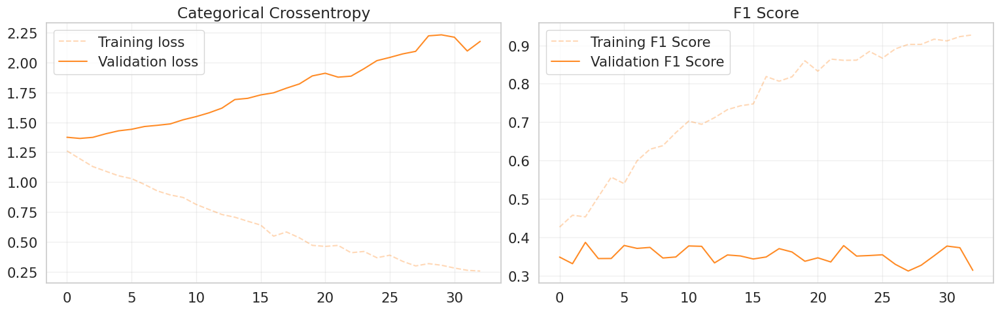

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(RN_ft_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(RN_ft_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(RN_ft_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(RN_ft_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# **Tensorboard**

In [ ]:
# In a Colab cell

%load_ext tensorboard
%tensorboard --logdir tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# **K-shuffle**

## Parameters and function k-shuffle

In [ ]:
# Cross-validation
# Number of splits
K = 3

# Value of the split
VAL_SIZE = 0.3

# Choice of model
# 1. en (efficientNetB0) or mn (MobileNetV3Small) or RN (ResNet18)
NET = 'en'
# 2. from scratch, transfer learning, fine tuning
MOD = 'transfer learning'

Here we will compute the k-shuffle cross validation on the EfficientNet model, transfer learning. If we want the values for the other models, with other learning strategies, we just have to change the variables NET and MOD, and compute again. We can also choose to use the masks or not.

This enables us to find the results presented in the challenge report.

In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import torch
from torchvision import transforms


def k_shuffle_split_cross_validation_image(
    X_train,
    y_train_int,
    epochs,
    criterion,
    device,
    k,
    val_size,
    batch_size,
    learning_rate,
    dropout_rate,
    net,
    mod,
    X_train_masks=X_train_masks,
    patience=0,
    seed=42,
    experiment_name="K-shuffle",
    logs_dir="runs",
    writer=None,
    verbose=10,
    mask=False
):
    """
    K-shuffle split CV for image classification.

    Returns:
      fold_losses: dict split_i -> list of val_loss per epoch
      fold_metrics: dict split_i -> list of val_f1 per epoch
      best_scores: dict split_i -> best val_f1 for that split, plus mean/std
    """

    fold_losses = {}
    fold_metrics = {}
    best_scores = {}

    # fixed augmentation
    train_augmentation = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
        transforms.RandomErasing(p=0.5, scale=(0.02, 0.2)),
    ])

    # decide normalization stats
    mean = IMAGENET_MEAN
    std = IMAGENET_STD

    for split_idx in range(k):
        if verbose > 0:
            print(f"\nSplit {split_idx + 1}/{k}")

        index_TRAIN, index_VAL, y_TRAIN, y_VAL = train_test_split(
            np.arange(len(X_train)),
            y_train_int,
            test_size=val_size,
            random_state=seed + split_idx,   # different shuffle each split
            stratify=y_train_int
        )

        X_TRAIN = X_train[index_TRAIN]
        X_VAL   = X_train[index_VAL]

        # optional masks
        if X_train_masks is not None:
            X_MASK_TRAIN = X_train_masks[index_TRAIN]
            X_MASK_VAL   = X_train_masks[index_VAL]

        if verbose > 0:
            print(f"  Training images:   {len(X_TRAIN)}")
            print(f"  Validation images: {len(X_VAL)}")

        num_classes = len(class_names)

        # Model selection
        if net == "en":
            if mod == "from scratch":
                model = EfficientNetB0FromScratch(num_classes, dropout_rate).to(device)
            elif mod == "transfer learning":
                model = EfficientNetB0TransferLearning(num_classes, dropout_rate, freeze_backbone=True).to(device)
            elif mod == "fine tuning":
                model = EfficientNetB0TransferLearning(num_classes, dropout_rate, freeze_backbone=False).to(device)
                # freeze all, unfreeze classifier + last blocks
                for p in model.parameters():
                    p.requires_grad = False
                for p in model.backbone.classifier.parameters():
                    p.requires_grad = True
                for block in model.backbone.features[-2:]:
                    for p in block.parameters():
                        p.requires_grad = True
            else:
                raise ValueError(f"Unknown mod='{mod}' for net='en'")

        elif net == "mn":
            if mod == "from scratch":
                model = MobileNetV3FromScratch(num_classes, dropout_rate).to(device)
            elif mod == "transfer learning":
                model = MobileNetV3TransferLearning(num_classes, dropout_rate, freeze_backbone=True).to(device)
            elif mod == "fine tuning":
                model = MobileNetV3TransferLearning(num_classes, dropout_rate, freeze_backbone=False).to(device)
                # Unfreeze the last N layers of the backbone
                N_LAYERS_TO_UNFREEZE = 20
                # First, freeze everything
                for param in model.backbone.parameters():
                    param.requires_grad = False
                # Unfreeze last N layers (excluding classifier which is always trainable)
                backbone_layers = list(model.backbone.features.children())
                for layer in backbone_layers[-N_LAYERS_TO_UNFREEZE:]:
                    for param in layer.parameters():
                        param.requires_grad = True
            else:
                raise ValueError(f"Unknown mod='{mod}' for net='mn'")

        elif net == "rn":
            if mod == "from scratch":
                model = ResNet18FromScratch(num_classes, dropout_rate).to(device)
            elif mod == "transfer learning":
                model = ResNet18TransferLearning(num_classes, dropout_rate, freeze_backbone=True).to(device)
            elif mod == "fine tuning":
                model = ResNet18TransferLearning(num_classes, dropout_rate, freeze_backbone=False).to(device)
                # The final classification layer (fc) is always trainable
                for param in model.backbone.fc.parameters():
                    param.requires_grad = True
                for param in model.backbone.layer4.parameters():
                    param.requires_grad = True
            else:
                raise ValueError(f"Unknown mod='{mod}' for net='rn'")

        else:
            raise ValueError(f"Unknown net='{net}' (expected 'en' or 'mn')")

        # Data
        if False == mask:
          train_ds = TissueDataset(
              X_TRAIN, y_TRAIN,
              mean=mean, std=std,
              augmentation=train_augmentation,
              normalize_imagenet=True
          )
          val_ds = TissueDataset(
              X_VAL, y_VAL,
              mean=mean, std=std,
              augmentation=None,
              normalize_imagenet=True
          )

        else:
            print("yes")
            train_ds = TissueDataset(
                X_TRAIN, y_TRAIN, X_MASK_TRAIN,
                mean=mean, std=std,
                augmentation=train_augmentation,
                normalize_imagenet=True
            )
            val_ds = TissueDataset(
                X_VAL, y_VAL, X_MASK_VAL,
                mean=mean, std=std,
                augmentation=None,
                normalize_imagenet=True
            )
        train_loader = make_loader(train_ds, batch_size, shuffle=True, drop_last=False)
        val_loader = make_loader(val_ds, batch_size, shuffle=False, drop_last=False)

        # Training setup
        split_exp_name = f"{experiment_name}_split{split_idx}"
        local_writer = writer
        if local_writer is None:
            local_writer = SummaryWriter(f"./{logs_dir}/{split_exp_name}")

        optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
        scaler = torch.amp.GradScaler(enabled=(device.type == "cuda"))

        # Train
        model, training_history = fit(
            model=model,
            train_loader=train_loader,
            val_loader=val_loader,
            epochs=epochs,
            criterion=criterion,
            optimizer=optimizer,
            scaler=scaler,
            device=device,
            writer=local_writer,
            verbose=verbose,
            experiment_name=split_exp_name,
            patience=patience
        )

        # store histories
        fold_losses[f"split_{split_idx}"] = training_history["val_loss"]
        fold_metrics[f"split_{split_idx}"] = training_history["val_f1"]
        best_scores[f"split_{split_idx}"] = float(np.max(training_history["val_f1"]))

        if writer is None:
            local_writer.close()

    # aggregate
    split_keys = [k_ for k_ in best_scores if k_.startswith("split_")]
    best_scores["mean"] = float(np.mean([best_scores[k_] for k_ in split_keys]))
    best_scores["std"]  = float(np.std([best_scores[k_] for k_ in split_keys]))

    if verbose > 0:
        print(f"\nBest score: {best_scores['mean']:.4f}±{best_scores['std']:.4f}")

    return fold_losses, fold_metrics, best_scores


## Execution of k-shuffle

In [ ]:
%%time
# K-shuffle cross-validation (baseline configuration)
fold_losses, fold_metrics, best_scores = k_shuffle_split_cross_validation_image(
    X_train=X_train,
    y_train_int=y_train_int,
    epochs=50,
    criterion=criterion,
    device=device,
    k=K,
    val_size=VAL_SIZE,
    batch_size=BATCH_SIZE,
    learning_rate=LEARNING_RATE,
    dropout_rate=DROPOUT_RATE,
    net=NET,
    mod=MOD,
    patience=PATIENCE,
    seed=SEED,
    experiment_name="baseline_kshuffle",
    logs_dir=logs_dir,     # or "runs"
    writer=None,
    verbose=VERBOSE,
    mask=True
)


Split 1/3
  Training images:   441
  Validation images: 189
yes
Training 50 epochs...
Epoch   1/50 | Train: Loss=1.3933, F1=0.2639 | Val: Loss=1.3857, F1=0.2268
Epoch  10/50 | Train: Loss=1.2945, F1=0.3290 | Val: Loss=1.3430, F1=0.2863
Epoch  20/50 | Train: Loss=1.2747, F1=0.3592 | Val: Loss=1.3294, F1=0.3514
Epoch  30/50 | Train: Loss=1.2612, F1=0.3701 | Val: Loss=1.3238, F1=0.3616
Epoch  40/50 | Train: Loss=1.2071, F1=0.3985 | Val: Loss=1.3389, F1=0.3764
Epoch  50/50 | Train: Loss=1.2483, F1=0.4031 | Val: Loss=1.3449, F1=0.3531
Best model restored from epoch 34 with val_f1 0.3937

Split 2/3
  Training images:   441
  Validation images: 189
yes
Training 50 epochs...
Epoch   1/50 | Train: Loss=1.3782, F1=0.2675 | Val: Loss=1.3753, F1=0.2637
Epoch  10/50 | Train: Loss=1.3083, F1=0.3396 | Val: Loss=1.3464, F1=0.2181
Epoch  20/50 | Train: Loss=1.2756, F1=0.3784 | Val: Loss=1.3257, F1=0.2512
Epoch  30/50 | Train: Loss=1.2801, F1=0.3806 | Val: Loss=1.3178, F1=0.2866
Epoch  40/50 | Train: L

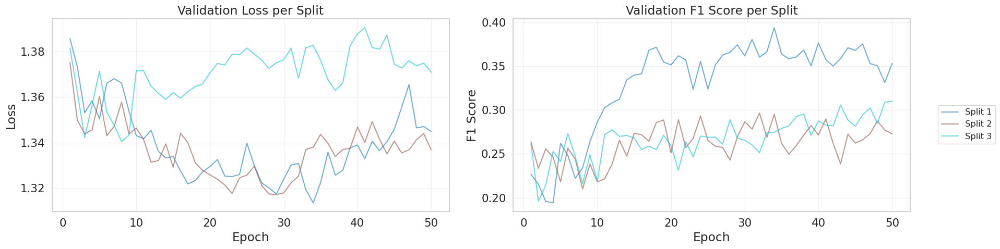

In [ ]:
def plot_kfold_history(fold_losses, fold_metrics, patience=0):
    """
    Plot validation loss and F1 history for each K-fold split.

    Args:
        fold_losses (dict): keys 'split_0', 'split_1', ... mapped to list of val losses.
        fold_metrics (dict): keys 'split_0', 'split_1', ... mapped to list of val F1 scores.
        patience (int): early stopping patience used during training.
    """
    # Infer K from the dict keys
    split_keys = sorted([k for k in fold_losses.keys() if k.startswith("split_")])
    K = len(split_keys)

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 5), sharex=True)

    # Color palette for K splits
    colors = plt.cm.get_cmap('tab10', K)

    # Plot validation loss
    for i, key in enumerate(split_keys):
        loss_history = fold_losses[key]

        if patience > 0 and len(loss_history) > patience:
            loss_history = loss_history[:-patience]

        epochs_range = range(1, len(loss_history) + 1)
        axes[0].plot(epochs_range, loss_history,
                     label=f'Split {i+1}',
                     color=colors(i),
                     alpha=0.6)

    axes[0].set_title('Validation Loss per Split')
    axes[0].set_ylabel('Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].grid(alpha=0.3)

    # Plot validation F1
    for i, key in enumerate(split_keys):
        f1_history = fold_metrics[key]

        if patience > 0 and len(f1_history) > patience:
            f1_history = f1_history[:-patience]

        epochs_range = range(1, len(f1_history) + 1)
        axes[1].plot(epochs_range, f1_history,
                     label=f'Split {i+1}',
                     color=colors(i),
                     alpha=0.6)

    axes[1].set_title('Validation F1 Score per Split')
    axes[1].set_ylabel('F1 Score')
    axes[1].set_xlabel('Epoch')
    axes[1].grid(alpha=0.3)

    # Shared legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='center left',
               bbox_to_anchor=(1, 0.5), fontsize='small')

    plt.tight_layout()
    plt.subplots_adjust(right=0.975)
    plt.show()

plot_kfold_history(fold_losses, fold_metrics)

# **Mask application**
In this section, we will try to train our model with the images when the mask has been applied.

For this section, we will train the EfficientNetB0 model, with Transfer Learning.

## EfficientNetB0 from scratch + Mask application

In [ ]:
# Create transfer learning model
mask_model_scratch = EfficientNetB0FromScratch(num_classes, DROPOUT_RATE).to(device)

# Display model summary
summary(mask_model_scratch, input_size=input_shape)
model_graph = draw_graph(mask_model_scratch, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITH ImageNet normalization (for pretrained model)
train_scratch_ds = TissueDataset(X_TRAIN, y_TRAIN, X_MASK_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_scratch_ds = TissueDataset(X_VAL, y_VAL, X_MASK_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_scratch_loader = make_loader(train_tl_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_scratch_loader = make_loader(val_tl_ds, BATCH_SIZE, shuffle=False, drop_last=False)

## Visualisation of the masked images

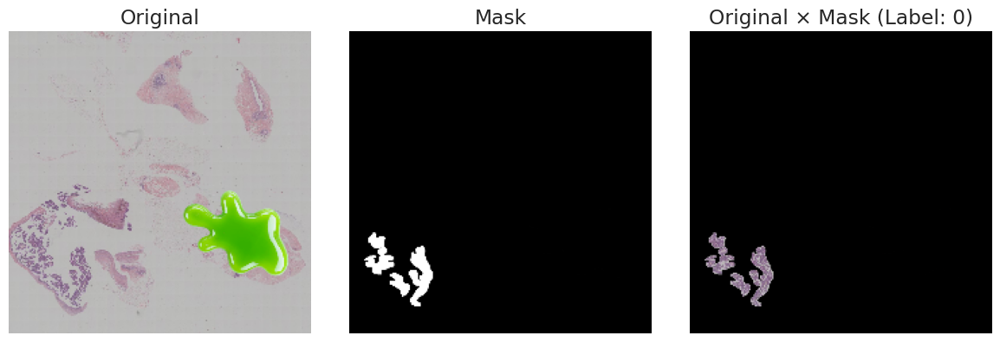

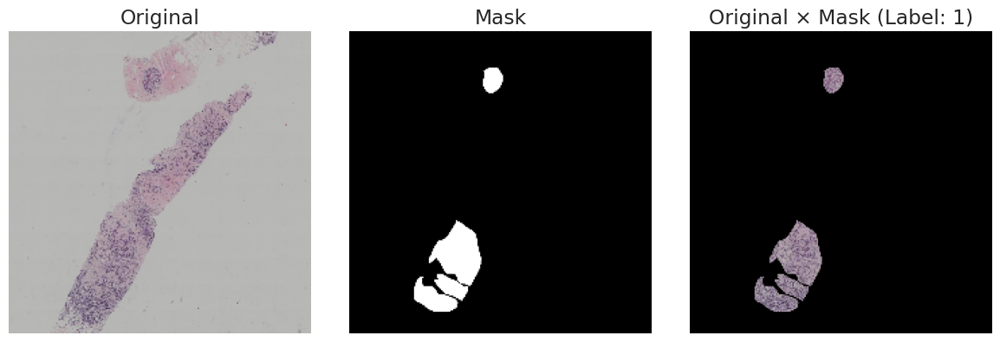

In [ ]:
# Create a temporary dataset for the visualisation
visualisation_ds = TissueDataset(
    X_TRAIN,
    y_TRAIN,
    masks=X_MASK_TRAIN,
    augmentation=None,
    normalize_imagenet=False
)

# Number of samples to visualize
N_SAMPLES = 2
start_idx = 30 # We modify this to see another part of the dataset.
# The number  enables us to see a blob and its corrected mask
rng = random.Random(SEED+start_idx)
indices = rng.sample(range(len(visualisation_ds)), N_SAMPLES)

for idx in indices:
    # Original image (no mask)
    original = visualisation_ds.data[idx].cpu().numpy().transpose(1, 2, 0)

    # Mask
    mask = visualisation_ds.masks[idx].cpu().numpy()

    # FIX : enlever la dimension canal pour l'affichage
    if mask.ndim == 3:
        mask = mask[0]   # (1, H, W) → (H, W)

    # Masked image (as used by the model)
    masked, label = visualisation_ds[idx]
    masked = masked.cpu().numpy().transpose(1, 2, 0)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(masked)
    plt.title(f"Original × Mask (Label: {label})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
# Setup training
experiment_name = "mask_learning_scratch"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(mask_model_scratch.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

## Training

In [ ]:
%%time
# Train with transfer learning
mask_model_scratch, mask_history_scratch = fit(
    model=mask_model_scratch,
    train_loader=train_scratch_loader,
    val_loader=val_scratch_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(mask_history_scratch['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.4006, F1=0.2578 | Val: Loss=1.3421, F1=0.1808
Epoch  10/300 | Train: Loss=1.3523, F1=0.2580 | Val: Loss=1.3320, F1=0.1808
Epoch  20/300 | Train: Loss=1.3315, F1=0.2383 | Val: Loss=1.3407, F1=0.1942
Epoch  30/300 | Train: Loss=1.3116, F1=0.2608 | Val: Loss=1.3600, F1=0.2413
Epoch  40/300 | Train: Loss=1.3217, F1=0.2144 | Val: Loss=1.4366, F1=0.2272
Epoch  50/300 | Train: Loss=1.3048, F1=0.2862 | Val: Loss=1.7411, F1=0.2312
Epoch  60/300 | Train: Loss=1.3007, F1=0.2579 | Val: Loss=1.3930, F1=0.2532
Epoch  70/300 | Train: Loss=1.3056, F1=0.2997 | Val: Loss=1.4513, F1=0.2035
Early stopping triggered after 76 epochs.
Best model restored from epoch 46 with val_f1 0.2803
Final validation F1 score: 28.03%
CPU times: user 1min 26s, sys: 20.1 s, total: 1min 46s
Wall time: 3min 9s


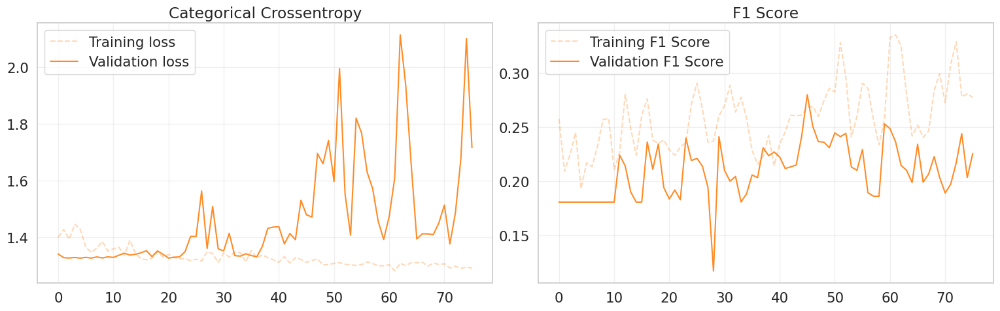

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(mask_history_scratch['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(mask_history_scratch['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(mask_history_scratch['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(mask_history_scratch['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## EfficientNetB0 transfer learning + Mask application

In [ ]:
# Create transfer learning model
mask_tl_model = EfficientNetB0TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=True).to(device)

# Display model summary
summary(mask_tl_model, input_size=input_shape)
model_graph = draw_graph(mask_tl_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
model_graph.visual_graph

In [ ]:
# Define augmentation for training
train_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=0, translate=(0.2, 0.2)),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.2))
])

# Create datasets WITH ImageNet normalization (for pretrained model)
train_tl_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_tl_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)

train_tl_loader = make_loader(train_tl_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_tl_loader = make_loader(val_tl_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup training
experiment_name = "mask_tl"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(mask_tl_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Train with transfer learning
mask_tl_model, mask_tl_history = fit(
    model=mask_tl_model,
    train_loader=train_tl_loader,
    val_loader=val_tl_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(mask_tl_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.3763, F1=0.2807 | Val: Loss=1.3456, F1=0.2635
Epoch  10/300 | Train: Loss=1.2725, F1=0.4162 | Val: Loss=1.3256, F1=0.3287
Epoch  20/300 | Train: Loss=1.2425, F1=0.4271 | Val: Loss=1.3294, F1=0.3311
Epoch  30/300 | Train: Loss=1.1586, F1=0.4477 | Val: Loss=1.3492, F1=0.3397
Epoch  40/300 | Train: Loss=1.1818, F1=0.4513 | Val: Loss=1.3548, F1=0.3160
Epoch  50/300 | Train: Loss=1.1531, F1=0.4787 | Val: Loss=1.3779, F1=0.2931
Epoch  60/300 | Train: Loss=1.1411, F1=0.4505 | Val: Loss=1.3983, F1=0.3016
Early stopping triggered after 64 epochs.
Best model restored from epoch 34 with val_f1 0.3519
Final validation F1 score: 35.19%
CPU times: user 31.2 s, sys: 16.6 s, total: 47.8 s
Wall time: 1min 57s


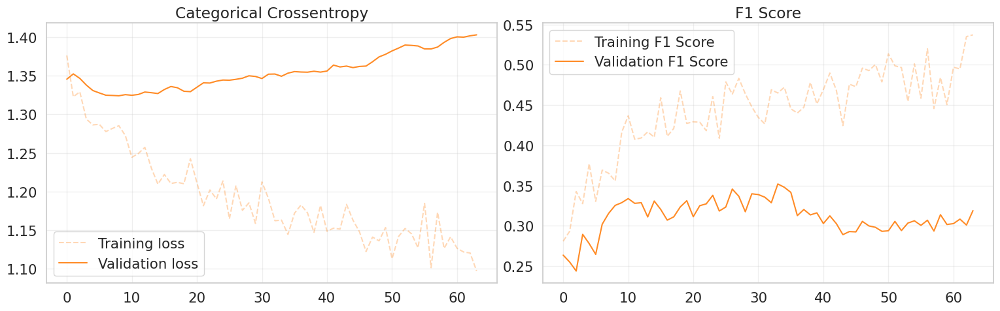

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(mask_tl_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(mask_tl_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(mask_tl_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(mask_tl_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

## *Fine-Tuning*

In [ ]:
# Load the transfer learning model
mask_ft_model = EfficientNetB0TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=False).to(device)
mask_ft_model.load_state_dict(torch.load("models/mask_tl_model.pt"))

# Strategy: Freeze everything first, then unfreeze the last few blocks
for param in mask_ft_model.parameters():
    param.requires_grad = False

# The classifier is always trainable
for param in mask_ft_model.backbone.classifier.parameters():
    param.requires_grad = True

# Unfreeze the last 2 blocks of the feature extractor (EfficientNet-B0 has 9 blocks usually)
# Adjust slice index [-2:] to unfreeze more or fewer layers
for block in mask_ft_model.backbone.features[-2:]:
    for param in block.parameters():
        param.requires_grad = True

# Check trainable parameters
trainable_params = sum(p.numel() for p in mask_ft_model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in mask_ft_model.parameters())
print(f"Trainable parameters: {trainable_params:,} / {total_params:,}")

Trainable parameters: 1,134,516 / 4,012,672


In [ ]:
# Reuse datasets from transfer learning (with ImageNet normalization)
train_ft_ds = TissueDataset(X_TRAIN, y_TRAIN, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=train_augmentation, normalize_imagenet=True)
val_ft_ds = TissueDataset(X_VAL, y_VAL, mean=IMAGENET_MEAN, std=IMAGENET_STD,augmentation=None, normalize_imagenet=True)

train_ft_loader = make_loader(train_ft_ds, BATCH_SIZE, shuffle=True, drop_last=False)
val_ft_loader = make_loader(val_ft_ds, BATCH_SIZE, shuffle=False, drop_last=False)

In [ ]:
# Setup Training (Lower learning rate for Fine-Tuning)
experiment_name = "mask_fine_tuning"
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
optimizer = torch.optim.Adam(mask_ft_model.parameters(), lr=LEARNING_RATE/10) # 10x smaller LR
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [ ]:
%%time
# Fine-tune the model
mask_ft_model, mask_ft_history = fit(
    model=mask_ft_model,
    train_loader=train_ft_loader,
    val_loader=val_ft_loader,
    epochs=EPOCHS,
    criterion=criterion,
    optimizer=optimizer,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=VERBOSE,
    experiment_name=experiment_name,
    patience=PATIENCE
)

# Calculate and print the final validation F1 score
final_val_f1 = round(max(mask_ft_history['val_f1']) * 100, 2)
print(f'Final validation F1 score: {final_val_f1}%')

Training 300 epochs...
Epoch   1/300 | Train: Loss=1.1883, F1=0.4417 | Val: Loss=1.3466, F1=0.3370
Epoch  10/300 | Train: Loss=1.0922, F1=0.5201 | Val: Loss=1.3759, F1=0.3420
Epoch  20/300 | Train: Loss=1.0524, F1=0.5558 | Val: Loss=1.3974, F1=0.3472
Epoch  30/300 | Train: Loss=0.9777, F1=0.6131 | Val: Loss=1.4305, F1=0.3293
Early stopping triggered after 32 epochs.
Best model restored from epoch 2 with val_f1 0.3527
Final validation F1 score: 35.27%
CPU times: user 16.2 s, sys: 8.14 s, total: 24.3 s
Wall time: 59.4 s


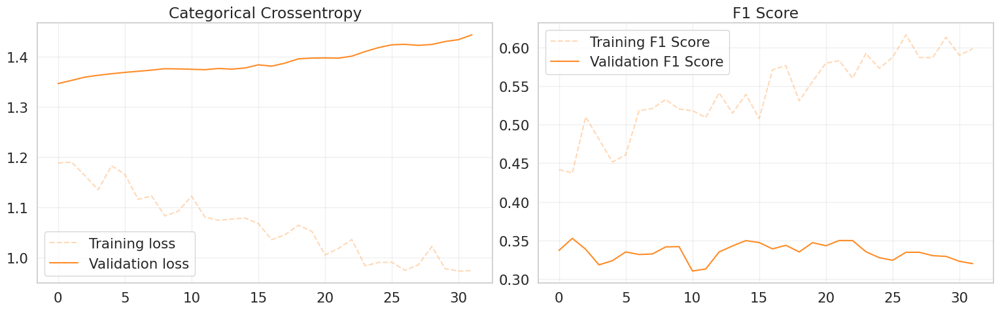

In [ ]:
# @title Plot History
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(mask_ft_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(mask_ft_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Categorical Crossentropy')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(mask_ft_history['train_f1'], label='Training F1 Score', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(mask_ft_history['val_f1'], label='Validation F1 Score', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1 Score')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

# **Grid search**

In [ ]:
from itertools import product
import numpy as np


def grid_search_cv_image(
    X_train,
    y_train_int,
    param_grid,
    fixed_params,
    cv_params,
    verbose=True
):
    """
    Grid search with k-shuffle cross-validation.

    param_grid: parameters to sweep (batch_size, learning_rate, dropout_rate, net, mod)
    fixed_params: parameters kept constant across runs
    cv_params: training and cross-validation parameters
    """

    param_names = list(param_grid.keys())
    param_values = [param_grid[p] for p in param_names]
    combinations = list(product(*param_values))

    results = {}
    best_score = -np.inf
    best_config = None

    for idx, combo in enumerate(combinations, 1):
        config = dict(zip(param_names, combo))
        config_name = "_".join(f"{k}_{v}" for k, v in config.items())

        if verbose:
            print(f"\nConfiguration {idx}/{len(combinations)}")
            for k, v in config.items():
                print(f"  {k}: {v}")

        run_params = {**fixed_params, **config}

        _, _, scores = k_shuffle_split_cross_validation_image(
            X_train=X_train,
            y_train_int=y_train_int,
            experiment_name=config_name,
            **run_params,
            **cv_params
        )

        results[config_name] = scores

        mean_score = scores["mean"]
        if mean_score > best_score:
            best_score = mean_score
            best_config = config.copy()
            if verbose:
                print("  New best configuration")

        if verbose:
            print(f"  Score: {scores['mean']:.4f} ± {scores['std']:.4f}")

    return results, best_config, best_score


In [ ]:
import matplotlib.pyplot as plt


def plot_top_configurations_image(results, k_splits, top_n=5, figsize=(14, 7)):
    """
    Boxplot of per-split scores for the top configurations.
    """

    sorted_configs = sorted(
        results.items(),
        key=lambda x: x[1]["mean"],
        reverse=True
    )[:top_n]

    boxplot_data = []
    labels = []

    for name, data in sorted_configs:
        split_scores = [
            data[f"split_{i}"] for i in range(k_splits)
            if f"split_{i}" in data
        ]

        boxplot_data.append(split_scores)
        labels.append(f"{name}\n(μ={data['mean']:.3f})")

    fig, ax = plt.subplots(figsize=figsize)
    ax.boxplot(boxplot_data, labels=labels, showmeans=True, meanline=True)
    ax.set_ylabel("Score")
    ax.set_title(f"Top {len(sorted_configs)} configurations")
    ax.grid(axis="y", alpha=0.3)
    ax.tick_params(axis="x", labelsize=6)
    plt.tight_layout()
    plt.show()


Configuration 1/8
  batch_size: 32
  learning_rate: 0.001
  dropout_rate: 0.3

Split 1/5
  Training images:   504
  Validation images: 126
Training 20 epochs...
Epoch   1/20 | Train: Loss=1.3598, F1=0.2465 | Val: Loss=1.3643, F1=0.3461
Epoch   2/20 | Train: Loss=1.3377, F1=0.3165 | Val: Loss=1.3660, F1=0.2925
Epoch   3/20 | Train: Loss=1.2910, F1=0.3350 | Val: Loss=1.3523, F1=0.3178
Epoch   4/20 | Train: Loss=1.2886, F1=0.3680 | Val: Loss=1.3515, F1=0.3004
Epoch   5/20 | Train: Loss=1.2901, F1=0.3576 | Val: Loss=1.3529, F1=0.3045
Epoch   6/20 | Train: Loss=1.2701, F1=0.3541 | Val: Loss=1.3602, F1=0.2992
Early stopping triggered after 6 epochs.
Best model restored from epoch 1 with val_f1 0.3461

Split 2/5
  Training images:   504
  Validation images: 126
Training 20 epochs...
Epoch   1/20 | Train: Loss=1.3699, F1=0.2817 | Val: Loss=1.3867, F1=0.2507
Epoch   2/20 | Train: Loss=1.3334, F1=0.2910 | Val: Loss=1.3648, F1=0.2937
Epoch   3/20 | Train: Loss=1.3103, F1=0.3103 | Val: Loss=1.356

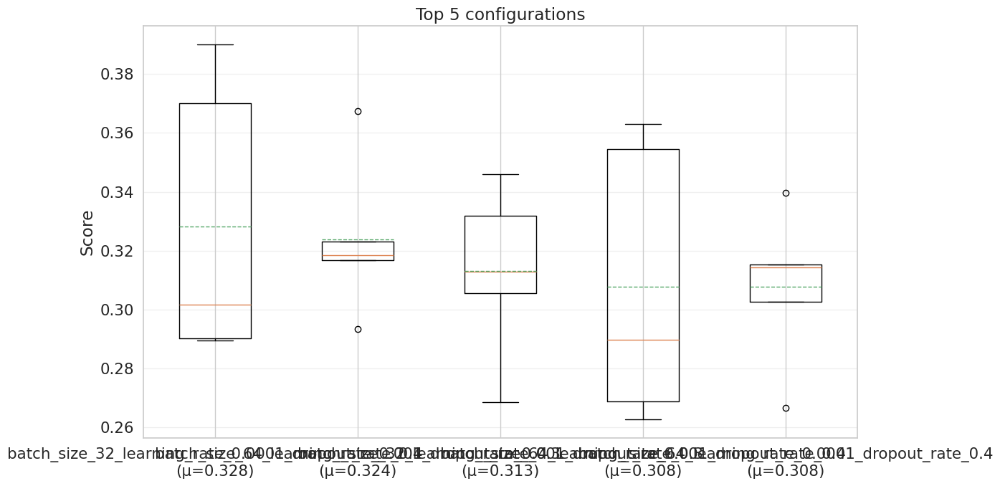

In [ ]:
param_grid = {
    "batch_size": [32, 64],
    "learning_rate": [1e-3, 1e-4],
    "dropout_rate": [0.3, 0.4],
}

fixed_params = {
    "net": "en",
    "mod": "transfer learning",
}

cv_params = {
    "epochs": 20,
    "criterion": criterion,
    "device": device,
    "k": 5,
    "val_size": 0.2,
    "patience": 5,
    "verbose": 1,
    "seed": 42,
}

results, best_cfg, best_score = grid_search_cv_image(
    X_train, y_train_int, param_grid, fixed_params, cv_params, verbose=True
)

plot_top_configurations_image(results, k_splits=cv_params["k"], top_n=5)

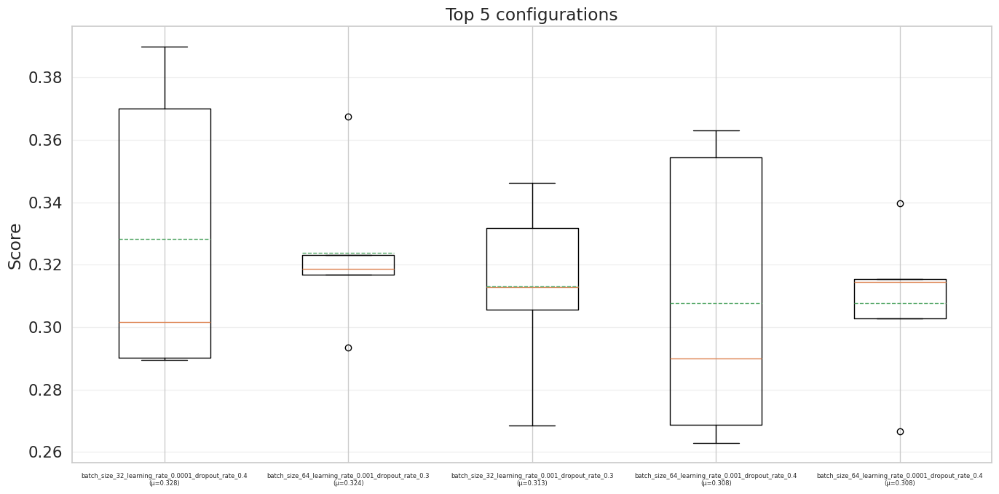

In [ ]:
plot_top_configurations_image(results, k_splits=cv_params["k"], top_n=5)

# **Submission csv file**
This last section is dedicated to the prediction of the labels of the test set, and to the creation of the submission .csv file.

## Loading of the test set
Loading the test image/mask pairs into X_test and X_test_mask

In [ ]:
test_img_path = "data/test_data"
X_test, X_test_masks, _ = load_images_and_masks_from_folder(test_img_path, None)
print(f"Loaded {len(X_test)} test images and {len(X_test_masks)} test masks.")

New pytorch dataset for the test set

In [ ]:
class TissueTestDataset(torch.utils.data.Dataset):
    """Custom PyTorch Dataset for test/inference, with optional masks, augmentation, and normalization."""

    def __init__(self, data, masks=None, mean=None, std=None, augmentation=None, normalize_imagenet=False):
        """
        Args:
            data: numpy array of images (N, H, W, C) in range [0,1]
            masks: numpy array of masks (optional), shape (N,H,W,C) or (N,H,W)
            augmentation: optional augmentation transform
            normalize_imagenet: whether to apply ImageNet normalization
        """
        # Convert to torch tensors and rearrange to (N, C, H, W)
        self.data = torch.from_numpy(data).permute(0, 3, 1, 2).float()

        if masks is not None:
            if masks.ndim == 4:  # N,H,W,C or N,H,W,1
                self.masks = torch.from_numpy(masks).permute(0, 3, 1, 2).float()
            elif masks.ndim == 3:  # N,H,W
                self.masks = torch.from_numpy(masks).unsqueeze(1).float()
            else:
                raise ValueError("Unsupported mask shape")
        else:
            self.masks = None

        self.augmentation = augmentation
        self.normalize_imagenet = normalize_imagenet

        if normalize_imagenet:
            self.normalize = transforms.Normalize(mean=mean, std=std)
        else:
            self.normalize = None

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = self.data[idx].clone()

        # Apply mask if provided
        if self.masks is not None:
            mask = self.masks[idx]  # 1xHxW or CxHxW
            if mask.shape[0] == 1 and image.shape[0] == 3:
                mask = mask.repeat(3, 1, 1)
            image = image * mask

        # Apply augmentation if provided
        if self.augmentation:
            image = self.augmentation(image)

        # Apply ImageNet normalization if requested
        if self.normalize:
            image = self.normalize(image)

        return image


Dataset and dataloader creation

In [ ]:
from torch.utils.data import DataLoader, TensorDataset

test_ds = TissueTestDataset(X_test, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)
masked_test_ds = TissueTestDataset(X_test, X_test_masks, mean=IMAGENET_MEAN, std=IMAGENET_STD, augmentation=None, normalize_imagenet=True)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False)
masked_test_loader = DataLoader(test_ds, batch_size=1, shuffle=False)

Mapping of the classes

In [ ]:
class_names = ['Luminal A', 'Luminal B', 'HER2(+)', 'Triple negative']
class_to_index = {name: idx for idx, name in enumerate(class_names)}
print(class_to_index)

{'Luminal A': 0, 'Luminal B': 1, 'HER2(+)': 2, 'Triple negative': 3}


## Compute predictions
Submit function to compute the predictions of the model on the test set (puts the prediction corresponding to each image in a dataframe)

In [ ]:
def submit(model, test_loader, device):
    """Validate for one epoch."""
    model.eval()
    all_predictions = []

    with torch.no_grad():
        for inputs in test_loader:
            inputs = inputs.to(device)

            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                logits = model(inputs)

            predictions = logits.argmax(dim=1)
            all_predictions.append(predictions.cpu().numpy())

    all_predictions = np.concatenate(all_predictions)

    final_list = [class_names[i] for i in all_predictions]
    test_pred_df = pd.DataFrame(
        {'sample_index': [f"img_{i:04d}.png" for i in range(len(X_test))],
         'label': final_list}
        )

    return test_pred_df


Here we choose which model we want to use to predict the classes of the test set.

In [ ]:
# Choose model:
# 1. MobileNet:
  # MN_scrach_model --> from scratch
  # MN_tl_model --> transfer learning
  # MN_ft_model --> finetuned model
# 2. EfficientNet:
  # EN_scratch_model --> from scratch
  # EN_tl_model --> transfer learning
  # EN_ft_model --> finetuned model
# 3. RestNet
  # RN_scratch_model --> from scratch
  # RN_tl_model --> transfer learning
  # RN_ft_model --> finetuned model

#model = EN_tl_model
#test_df = submit(model, test_loader, device)

# Masked images : mask_model
model = mask_model
test_df = submit(model, masked_test_loader, device)

In [ ]:
display(test_df)

,sample_index,label
0,img_0000.png,Luminal B
1,img_0001.png,Luminal B
2,img_0002.png,Luminal B
3,img_0003.png,Luminal B
4,img_0004.png,Luminal A
...,...,...
472,img_0472.png,Luminal B
473,img_0473.png,Luminal B
474,img_0474.png,Luminal B
475,img_0475.png,Luminal B


## Class distribution
Visualisation of the class distribution of the predictions

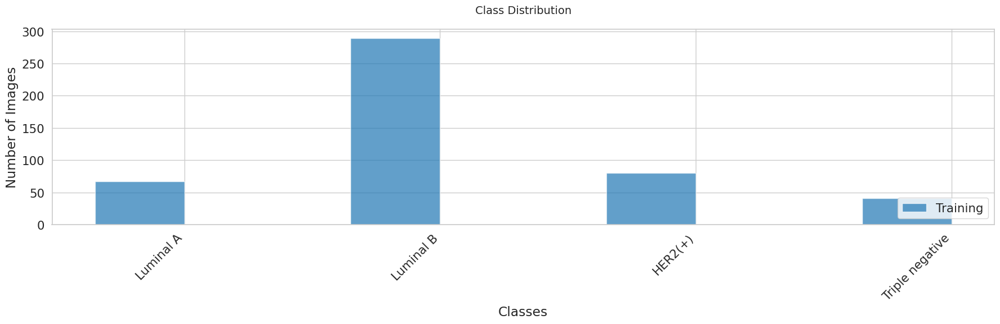

In [ ]:
y_test = test_df['label'].values
y_test_int = np.array([class_to_index[label] for label in y_test])

plot_class_distribution(y_test_int, X_test, class_names)

## Creation of the CSV file

In [ ]:
# Create folder "submissions" if non existant yet
if not os.path.exists("submissions"):
    os.makedirs("submissions")

# Choose submission filename
filename = "submissions/submission.csv"
test_df.to_csv(filename, index=False)